In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


[I 2025-05-22 22:42:26,105] A new study created in memory with name: no-name-87ac7055-1faf-4798-9fe5-aa09ee338d2a
[I 2025-05-22 22:48:45,509] Trial 0 finished with value: 0.06660415902733803 and parameters: {'lr': 0.009560984633744867, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.14626328206209793}. Best is trial 0 with value: 0.06660415902733803.


Cross Validation Accuracies:
[0.05288390815258026, 0.05684429034590721, 0.07494199275970459, 0.07966376841068268, 0.0686868354678154]
Mean Cross Validation Accuracy:
0.06660415902733803
Standard Deviation of Cross Validation Accuracy:
0.010275317323517734


[I 2025-05-22 22:55:43,089] Trial 1 finished with value: 0.0666363500058651 and parameters: {'lr': 0.10510541337566445, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.26198645936922565}. Best is trial 0 with value: 0.06660415902733803.


Cross Validation Accuracies:
[0.05127740278840065, 0.04901751130819321, 0.08058815449476242, 0.0848032683134079, 0.06749541312456131]
Mean Cross Validation Accuracy:
0.0666363500058651
Standard Deviation of Cross Validation Accuracy:
0.014640686427997103


[I 2025-05-22 23:04:26,726] Trial 2 finished with value: 0.07465960681438447 and parameters: {'lr': 0.0017502113193780843, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3697449667442483}. Best is trial 0 with value: 0.06660415902733803.


Cross Validation Accuracies:
[0.061348866671323776, 0.05442751571536064, 0.0879896879196167, 0.09742910414934158, 0.0721028596162796]
Mean Cross Validation Accuracy:
0.07465960681438447
Standard Deviation of Cross Validation Accuracy:
0.016057343122627677


[I 2025-05-22 23:16:40,706] Trial 3 finished with value: 100.30729827880859 and parameters: {'lr': 0.9362079676188234, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.14898145757382159}. Best is trial 0 with value: 0.06660415902733803.


Cross Validation Accuracies:
[112.74472045898438, 63.32182312011719, 111.53429412841797, 105.94060516357422, 107.99504852294922]
Mean Cross Validation Accuracy:
100.30729827880859
Standard Deviation of Cross Validation Accuracy:
18.652055807784222


[I 2025-05-22 23:27:17,754] Trial 4 finished with value: 0.07798401191830635 and parameters: {'lr': 0.18811944597325722, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3293303491911808}. Best is trial 0 with value: 0.06660415902733803.


Cross Validation Accuracies:
[0.06457798928022385, 0.061959121376276016, 0.07903145998716354, 0.0971786305308342, 0.08717285841703415]
Mean Cross Validation Accuracy:
0.07798401191830635
Standard Deviation of Cross Validation Accuracy:
0.013345291236772387


[I 2025-05-22 23:34:53,100] Trial 5 finished with value: 0.07416046634316445 and parameters: {'lr': 0.570273746939846, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3650014537925086}. Best is trial 0 with value: 0.06660415902733803.


Cross Validation Accuracies:
[0.07607252150774002, 0.060169633477926254, 0.070651575922966, 0.0934079959988594, 0.07050060480833054]
Mean Cross Validation Accuracy:
0.07416046634316445
Standard Deviation of Cross Validation Accuracy:
0.010913969539057579


[I 2025-05-22 23:43:02,805] Trial 6 finished with value: 0.06497357115149498 and parameters: {'lr': 0.03318092199808712, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1352752507840183}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.05206459388136864, 0.0475299209356308, 0.0774138867855072, 0.08252197504043579, 0.06533747911453247]
Mean Cross Validation Accuracy:
0.06497357115149498
Standard Deviation of Cross Validation Accuracy:
0.013665745410645268


[I 2025-05-22 23:54:36,429] Trial 7 finished with value: 0.06601926460862159 and parameters: {'lr': 0.08768613058784042, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.24930355875244264}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.05285150185227394, 0.04949928820133209, 0.07637084275484085, 0.0853765606880188, 0.0659981295466423]
Mean Cross Validation Accuracy:
0.06601926460862159
Standard Deviation of Cross Validation Accuracy:
0.013624684398681926


[I 2025-05-23 00:04:21,912] Trial 8 finished with value: 0.3913284093141556 and parameters: {'lr': 0.053261608132691415, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.19725005023119657}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.3151862621307373, 0.3379744291305542, 0.2439163774251938, 0.666256308555603, 0.3933086693286896]
Mean Cross Validation Accuracy:
0.3913284093141556
Standard Deviation of Cross Validation Accuracy:
0.14557736921362907


[I 2025-05-23 00:12:41,664] Trial 9 finished with value: 2.9201673746109007 and parameters: {'lr': 0.2505648964161146, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1546437137775607}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[2.4364070892333984, 2.553490400314331, 4.142506122589111, 4.226637840270996, 1.2417954206466675]
Mean Cross Validation Accuracy:
2.9201673746109007
Standard Deviation of Cross Validation Accuracy:
1.1301668483451968


[I 2025-05-23 00:20:15,003] Trial 10 finished with value: 0.06505805179476738 and parameters: {'lr': 0.015710070781797803, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.48605608660280464}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.05251997709274292, 0.04917405918240547, 0.0754784569144249, 0.08055183291435242, 0.0675659328699112]
Mean Cross Validation Accuracy:
0.06505805179476738
Standard Deviation of Cross Validation Accuracy:
0.012364757193488049


[I 2025-05-23 00:28:47,610] Trial 11 finished with value: 0.0670872338116169 and parameters: {'lr': 0.012424389423606578, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4859644430525375}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.05244949832558632, 0.052150920033454895, 0.07663602381944656, 0.0877276137471199, 0.0664721131324768]
Mean Cross Validation Accuracy:
0.0670872338116169
Standard Deviation of Cross Validation Accuracy:
0.013819839488099415


[I 2025-05-23 00:37:07,404] Trial 12 finished with value: 0.06507816538214684 and parameters: {'lr': 0.01816516516653347, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4834835944949638}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.052403226494789124, 0.051113251596689224, 0.07450543344020844, 0.08207029849290848, 0.06529861688613892]
Mean Cross Validation Accuracy:
0.06507816538214684
Standard Deviation of Cross Validation Accuracy:
0.012110552938586412


[I 2025-05-23 00:45:59,067] Trial 13 finished with value: 0.06836324483156205 and parameters: {'lr': 0.003322873228459186, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4157547280408592}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.06171509250998497, 0.059756409376859665, 0.0704076886177063, 0.08500124514102936, 0.06493578851222992]
Mean Cross Validation Accuracy:
0.06836324483156205
Standard Deviation of Cross Validation Accuracy:
0.009066706208416379


[I 2025-05-23 00:54:30,719] Trial 14 finished with value: 0.0656854696571827 and parameters: {'lr': 0.030494801587208097, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.22187176272150666}. Best is trial 6 with value: 0.06497357115149498.


Cross Validation Accuracies:
[0.05273224413394928, 0.05096947029232979, 0.07567291706800461, 0.08473856002092361, 0.06431415677070618]
Mean Cross Validation Accuracy:
0.0656854696571827
Standard Deviation of Cross Validation Accuracy:
0.013030706396719433


[I 2025-05-23 01:01:30,441] Trial 15 finished with value: 0.06422690823674201 and parameters: {'lr': 0.005213990483638926, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10363100789826823}. Best is trial 15 with value: 0.06422690823674201.


Cross Validation Accuracies:
[0.05235271155834198, 0.05046737566590309, 0.07259797304868698, 0.08066977560520172, 0.06504670530557632]
Mean Cross Validation Accuracy:
0.06422690823674201
Standard Deviation of Cross Validation Accuracy:
0.011588235102395128


[I 2025-05-23 01:09:03,296] Trial 16 finished with value: 0.06401044651865959 and parameters: {'lr': 0.004704626261440116, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10099752900483187}. Best is trial 16 with value: 0.06401044651865959.


Cross Validation Accuracies:
[0.054184138774871826, 0.05279484763741493, 0.0652112290263176, 0.08368440717458725, 0.06417760998010635]
Mean Cross Validation Accuracy:
0.06401044651865959
Standard Deviation of Cross Validation Accuracy:
0.011053330107122736


[I 2025-05-23 01:16:35,927] Trial 17 finished with value: 0.06817621588706971 and parameters: {'lr': 0.003886487146670615, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10634166909719381}. Best is trial 16 with value: 0.06401044651865959.


Cross Validation Accuracies:
[0.053373608738183975, 0.051480066031217575, 0.07684565335512161, 0.09428470581769943, 0.06489704549312592]
Mean Cross Validation Accuracy:
0.06817621588706971
Standard Deviation of Cross Validation Accuracy:
0.015908764561436486


[I 2025-05-23 01:24:05,309] Trial 18 finished with value: 0.06529476791620255 and parameters: {'lr': 0.0052573213629925125, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19423742772868116}. Best is trial 16 with value: 0.06401044651865959.


Cross Validation Accuracies:
[0.054765697568655014, 0.052803050726652145, 0.07443347573280334, 0.08039319515228271, 0.0640784204006195]
Mean Cross Validation Accuracy:
0.06529476791620255
Standard Deviation of Cross Validation Accuracy:
0.010769051096233006


[I 2025-05-23 01:29:58,532] Trial 19 finished with value: 0.10264798700809478 and parameters: {'lr': 0.0012528494963914378, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10650431005566183}. Best is trial 16 with value: 0.06401044651865959.


Cross Validation Accuracies:
[0.07579220086336136, 0.06399685144424438, 0.09713994711637497, 0.11498522758483887, 0.16132570803165436]
Mean Cross Validation Accuracy:
0.10264798700809478
Standard Deviation of Cross Validation Accuracy:
0.03417825180679293


[I 2025-05-23 01:36:23,821] Trial 20 finished with value: 0.06720314994454384 and parameters: {'lr': 0.006779081917850262, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2960999434407686}. Best is trial 16 with value: 0.06401044651865959.


Cross Validation Accuracies:
[0.054878175258636475, 0.0533023439347744, 0.07895688712596893, 0.08309920877218246, 0.06577913463115692]
Mean Cross Validation Accuracy:
0.06720314994454384
Standard Deviation of Cross Validation Accuracy:
0.012149076115688983


[I 2025-05-23 01:42:33,902] Trial 21 finished with value: 0.06531913727521896 and parameters: {'lr': 0.02703967401344278, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11911906772533493}. Best is trial 16 with value: 0.06401044651865959.


Cross Validation Accuracies:
[0.051449861377477646, 0.052231963723897934, 0.07578485459089279, 0.08271424472332001, 0.06441476196050644]
Mean Cross Validation Accuracy:
0.06531913727521896
Standard Deviation of Cross Validation Accuracy:
0.01246250233510511


[I 2025-05-23 01:48:44,980] Trial 22 finished with value: 0.3708173453807831 and parameters: {'lr': 0.0019341541621199774, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.16945901715886763}. Best is trial 16 with value: 0.06401044651865959.


Cross Validation Accuracies:
[0.39524850249290466, 0.3645026981830597, 0.37030184268951416, 0.33592474460601807, 0.3881089389324188]
Mean Cross Validation Accuracy:
0.3708173453807831
Standard Deviation of Cross Validation Accuracy:
0.020753384044418843


[I 2025-05-23 01:56:42,047] Trial 23 finished with value: 0.06174843087792396 and parameters: {'lr': 0.04960386825198899, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10145685487245752}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.049088891595602036, 0.048792991787195206, 0.06982985138893127, 0.08095581829547882, 0.06007460132241249]
Mean Cross Validation Accuracy:
0.06174843087792396
Standard Deviation of Cross Validation Accuracy:
0.012370465885639982


[I 2025-05-23 02:04:51,885] Trial 24 finished with value: 0.22601873725652694 and parameters: {'lr': 0.0025141004466413893, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.18612082762652188}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.17394691705703735, 0.3205016851425171, 0.2380731701850891, 0.31908103823661804, 0.07849087566137314]
Mean Cross Validation Accuracy:
0.22601873725652694
Standard Deviation of Cross Validation Accuracy:
0.09187913045288558


[I 2025-05-23 02:13:30,742] Trial 25 finished with value: 0.06551153808832169 and parameters: {'lr': 0.007916489295698393, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10139718933371428}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.05267392471432686, 0.05091038718819618, 0.07678993791341782, 0.08199972659349442, 0.06518371403217316]
Mean Cross Validation Accuracy:
0.06551153808832169
Standard Deviation of Cross Validation Accuracy:
0.012467301682056427


[I 2025-05-23 02:23:20,958] Trial 26 finished with value: 0.47098753452301023 and parameters: {'lr': 0.001034046248875732, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21989122260024976}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.4903325140476227, 0.48782074451446533, 0.45458972454071045, 0.4465008080005646, 0.47569388151168823]
Mean Cross Validation Accuracy:
0.47098753452301023
Standard Deviation of Cross Validation Accuracy:
0.017596720384222688


[I 2025-05-23 02:31:20,911] Trial 27 finished with value: 0.0657697044312954 and parameters: {'lr': 0.004284923698761231, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13096196612907346}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.05231771245598793, 0.0501122921705246, 0.07700013369321823, 0.08439704030752182, 0.0650213435292244]
Mean Cross Validation Accuracy:
0.0657697044312954
Standard Deviation of Cross Validation Accuracy:
0.01341469995266406


[I 2025-05-23 02:39:33,442] Trial 28 finished with value: 0.1406676232814789 and parameters: {'lr': 0.05132003039020828, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17473392778262847}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.13674813508987427, 0.12504158914089203, 0.14818242192268372, 0.15976928174495697, 0.13359668850898743]
Mean Cross Validation Accuracy:
0.1406676232814789
Standard Deviation of Cross Validation Accuracy:
0.012090318472868783


[I 2025-05-23 02:46:46,101] Trial 29 finished with value: 0.0649372510612011 and parameters: {'lr': 0.008828399578969717, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14746500445156807}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.052340067923069, 0.0513044036924839, 0.07547177374362946, 0.08226604014635086, 0.06330396980047226]
Mean Cross Validation Accuracy:
0.0649372510612011
Standard Deviation of Cross Validation Accuracy:
0.012316446381771245


[I 2025-05-23 02:57:10,611] Trial 30 finished with value: 0.3649869203567505 and parameters: {'lr': 0.019672682291109397, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.23010423113594192}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.46182072162628174, 0.3991168737411499, 0.36243805289268494, 0.25787514448165894, 0.34368380904197693]
Mean Cross Validation Accuracy:
0.3649869203567505
Standard Deviation of Cross Validation Accuracy:
0.06704459798445092


[I 2025-05-23 03:04:09,670] Trial 31 finished with value: 0.06491551920771599 and parameters: {'lr': 0.009980823826330611, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.13501292317501876}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.05172933638095856, 0.04939130321145058, 0.07663185149431229, 0.08181411772966385, 0.06501098722219467]
Mean Cross Validation Accuracy:
0.06491551920771599
Standard Deviation of Cross Validation Accuracy:
0.01294388572444211


[I 2025-05-23 03:10:56,758] Trial 32 finished with value: 0.06447017416357995 and parameters: {'lr': 0.011356021029435927, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12691321069568512}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.05186359956860542, 0.04953201115131378, 0.07557182013988495, 0.08138550817966461, 0.06399793177843094]
Mean Cross Validation Accuracy:
0.06447017416357995
Standard Deviation of Cross Validation Accuracy:
0.012583103896328164


[I 2025-05-23 03:16:44,380] Trial 33 finished with value: 0.0648932233452797 and parameters: {'lr': 0.005514452480512589, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.100019203809946}. Best is trial 23 with value: 0.06174843087792396.


Cross Validation Accuracies:
[0.05292682349681854, 0.050698816776275635, 0.0738334134221077, 0.08240055292844772, 0.06460651010274887]
Mean Cross Validation Accuracy:
0.0648932233452797
Standard Deviation of Cross Validation Accuracy:
0.01209290449318412


[I 2025-05-23 03:22:20,042] Trial 34 finished with value: 0.05845892056822777 and parameters: {'lr': 0.05340017004416082, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16275606149142183}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04482821747660637, 0.044052720069885254, 0.06427112221717834, 0.08125411719083786, 0.05788842588663101]
Mean Cross Validation Accuracy:
0.05845892056822777
Standard Deviation of Cross Validation Accuracy:
0.013762723718970964


[I 2025-05-23 03:29:48,040] Trial 35 finished with value: 0.07120359018445015 and parameters: {'lr': 0.10774231703538954, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1602705041467078}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.07155757397413254, 0.07156862318515778, 0.09018795937299728, 0.06482987850904465, 0.0578739158809185]
Mean Cross Validation Accuracy:
0.07120359018445015
Standard Deviation of Cross Validation Accuracy:
0.010760755035418785


[I 2025-05-23 03:36:55,413] Trial 36 finished with value: 4.407659482955933 and parameters: {'lr': 0.051311320823947966, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.28212370171567736}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[5.475284099578857, 4.073074817657471, 5.886758327484131, 5.721981048583984, 0.8811991214752197]
Mean Cross Validation Accuracy:
4.407659482955933
Standard Deviation of Cross Validation Accuracy:
1.8763190811334


[I 2025-05-23 03:44:37,124] Trial 37 finished with value: 0.07049790769815445 and parameters: {'lr': 0.2130398419006628, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12647455307416725}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.08565553277730942, 0.056231461465358734, 0.0842987671494484, 0.06920397281646729, 0.057099804282188416]
Mean Cross Validation Accuracy:
0.07049790769815445
Standard Deviation of Cross Validation Accuracy:
0.012688043587336982


[I 2025-05-23 03:51:15,845] Trial 38 finished with value: 0.06268733441829681 and parameters: {'lr': 0.13532876434578792, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.33463966461576955}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04920770227909088, 0.05124621093273163, 0.06299062818288803, 0.08403050899505615, 0.06596162170171738]
Mean Cross Validation Accuracy:
0.06268733441829681
Standard Deviation of Cross Validation Accuracy:
0.01248153704121652


[I 2025-05-23 03:58:31,916] Trial 39 finished with value: 8.904462242126465 and parameters: {'lr': 0.1263552491605731, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.33289267785860804}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[12.304970741271973, 5.844006538391113, 13.618948936462402, 2.9066858291625977, 9.847699165344238]
Mean Cross Validation Accuracy:
8.904462242126465
Standard Deviation of Cross Validation Accuracy:
4.000481214843652


[I 2025-05-23 04:04:18,135] Trial 40 finished with value: 0.07883587628602981 and parameters: {'lr': 0.3233571743592512, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3856250015478086}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.06666675955057144, 0.08659171313047409, 0.09276247769594193, 0.07714046537876129, 0.07101796567440033]
Mean Cross Validation Accuracy:
0.07883587628602981
Standard Deviation of Cross Validation Accuracy:
0.009655928526924092


[I 2025-05-23 04:10:10,992] Trial 41 finished with value: 0.059385199844837186 and parameters: {'lr': 0.1469834967853984, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3275936296480398}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.044461559504270554, 0.048008933663368225, 0.06960773468017578, 0.07641252130270004, 0.05843525007367134]
Mean Cross Validation Accuracy:
0.059385199844837186
Standard Deviation of Cross Validation Accuracy:
0.012226747501302775


[I 2025-05-23 04:15:36,099] Trial 42 finished with value: 0.063450388610363 and parameters: {'lr': 0.08511860034811662, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3295370816083328}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04762135446071625, 0.048250600695610046, 0.07559671998023987, 0.08008886873722076, 0.0656943991780281]
Mean Cross Validation Accuracy:
0.063450388610363
Standard Deviation of Cross Validation Accuracy:
0.013498146871853495


[I 2025-05-23 04:20:36,329] Trial 43 finished with value: 0.06489645093679428 and parameters: {'lr': 0.07893656761643573, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3371952340451568}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05240592733025551, 0.0517963282763958, 0.07658065855503082, 0.08263731747865677, 0.06106202304363251]
Mean Cross Validation Accuracy:
0.06489645093679428
Standard Deviation of Cross Validation Accuracy:
0.012598319604400245


[I 2025-05-23 04:25:30,921] Trial 44 finished with value: 0.06647060215473174 and parameters: {'lr': 0.14957251311517927, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3644746829120802}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.050122544169425964, 0.05452544987201691, 0.07625249028205872, 0.08518913388252258, 0.06626339256763458]
Mean Cross Validation Accuracy:
0.06647060215473174
Standard Deviation of Cross Validation Accuracy:
0.013084780197932291


[I 2025-05-23 04:30:55,309] Trial 45 finished with value: 0.06510649248957634 and parameters: {'lr': 0.06932062397013666, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.313361510905479}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05413409695029259, 0.049738213419914246, 0.07134460657835007, 0.08472047746181488, 0.06559506803750992]
Mean Cross Validation Accuracy:
0.06510649248957634
Standard Deviation of Cross Validation Accuracy:
0.012493507476888172


[I 2025-05-23 04:38:18,152] Trial 46 finished with value: 0.1932012140750885 and parameters: {'lr': 0.37151057449116476, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4080117812786033}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.20650435984134674, 0.19191932678222656, 0.16464751958847046, 0.20095080137252808, 0.20198406279087067]
Mean Cross Validation Accuracy:
0.1932012140750885
Standard Deviation of Cross Validation Accuracy:
0.015040777413351946


[I 2025-05-23 04:43:23,105] Trial 47 finished with value: 0.07609082832932472 and parameters: {'lr': 0.7211960301137827, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2672754696731795}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.0776406079530716, 0.05531364306807518, 0.07787031680345535, 0.0947960913181305, 0.07483348250389099]
Mean Cross Validation Accuracy:
0.07609082832932472
Standard Deviation of Cross Validation Accuracy:
0.012559678383598463


[I 2025-05-23 04:48:15,161] Trial 48 finished with value: 0.06541650742292404 and parameters: {'lr': 0.03786233850406579, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3507696253930843}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.053826890885829926, 0.0496092289686203, 0.07640698552131653, 0.08318673074245453, 0.06405270099639893]
Mean Cross Validation Accuracy:
0.06541650742292404
Standard Deviation of Cross Validation Accuracy:
0.012826696201555894


[I 2025-05-23 04:53:18,907] Trial 49 finished with value: 0.06236780434846878 and parameters: {'lr': 0.15290506909400572, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3910253013681405}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04695163667201996, 0.05475284159183502, 0.06697991490364075, 0.08007051050662994, 0.06308411806821823]
Mean Cross Validation Accuracy:
0.06236780434846878
Standard Deviation of Cross Validation Accuracy:
0.011232242501421805


[I 2025-05-23 04:58:25,091] Trial 50 finished with value: 0.07274044454097747 and parameters: {'lr': 0.14734655482715536, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4229099024905163}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05493342503905296, 0.05880479887127876, 0.08685287833213806, 0.08385113626718521, 0.07925998419523239]
Mean Cross Validation Accuracy:
0.07274044454097747
Standard Deviation of Cross Validation Accuracy:
0.013239371731479004


[I 2025-05-23 05:04:13,535] Trial 51 finished with value: 0.0648399643599987 and parameters: {'lr': 0.06935716047315943, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.31070562566455445}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05418678745627403, 0.05247960239648819, 0.07111390680074692, 0.08168308436870575, 0.06473644077777863]
Mean Cross Validation Accuracy:
0.0648399643599987
Standard Deviation of Cross Validation Accuracy:
0.010856633810907092


[I 2025-05-23 05:09:49,444] Trial 52 finished with value: 0.06273402571678162 and parameters: {'lr': 0.09668880800320845, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4481629117277134}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04687763750553131, 0.05159749835729599, 0.07398917526006699, 0.07950459420681, 0.061701223254203796]
Mean Cross Validation Accuracy:
0.06273402571678162
Standard Deviation of Cross Validation Accuracy:
0.012525528558760353


[I 2025-05-23 05:15:50,663] Trial 53 finished with value: 0.06556365713477134 and parameters: {'lr': 0.2514125101798442, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4562892685997815}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04764324799180031, 0.07203682512044907, 0.06492986530065536, 0.0707264095544815, 0.07248193770647049]
Mean Cross Validation Accuracy:
0.06556365713477134
Standard Deviation of Cross Validation Accuracy:
0.009359073440541515


[I 2025-05-23 05:20:18,810] Trial 54 finished with value: 0.06398381367325782 and parameters: {'lr': 0.17131060204461868, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.44553360309468876}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05172434821724892, 0.051270291209220886, 0.07106883823871613, 0.08452752232551575, 0.06132806837558746]
Mean Cross Validation Accuracy:
0.06398381367325782
Standard Deviation of Cross Validation Accuracy:
0.012579528354264721


[I 2025-05-23 05:26:11,691] Trial 55 finished with value: 0.06379378661513328 and parameters: {'lr': 0.10735586978898452, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.39189632069174357}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04664319381117821, 0.053421083837747574, 0.07339120656251907, 0.08378240466117859, 0.061731044203042984]
Mean Cross Validation Accuracy:
0.06379378661513328
Standard Deviation of Cross Validation Accuracy:
0.013398850874092627


[I 2025-05-23 05:30:55,768] Trial 56 finished with value: 0.07187611311674118 and parameters: {'lr': 0.467041756400033, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4499588112165683}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05333075299859047, 0.0644136592745781, 0.09813118726015091, 0.08299223333597183, 0.0605127327144146]
Mean Cross Validation Accuracy:
0.07187611311674118
Standard Deviation of Cross Validation Accuracy:
0.01638073295326323


[I 2025-05-23 05:35:02,621] Trial 57 finished with value: 0.10745584815740586 and parameters: {'lr': 0.04066316892198651, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.38191958240589174}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.08827510476112366, 0.09292857348918915, 0.11196201294660568, 0.12757116556167603, 0.11654238402843475]
Mean Cross Validation Accuracy:
0.10745584815740586
Standard Deviation of Cross Validation Accuracy:
0.014740687067008021


[I 2025-05-23 05:39:40,949] Trial 58 finished with value: 0.06595898568630218 and parameters: {'lr': 0.06001618632817417, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.36095872000597146}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.053243234753608704, 0.04989191144704819, 0.0732242688536644, 0.08624115586280823, 0.06719435751438141]
Mean Cross Validation Accuracy:
0.06595898568630218
Standard Deviation of Cross Validation Accuracy:
0.013308028452902512


[I 2025-05-23 05:43:47,388] Trial 59 finished with value: 0.06282724887132644 and parameters: {'lr': 0.2195087417850515, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.46877709134940854}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.0600200854241848, 0.054938122630119324, 0.07151775807142258, 0.07298135757446289, 0.05467892065644264]
Mean Cross Validation Accuracy:
0.06282724887132644
Standard Deviation of Cross Validation Accuracy:
0.007939075586971184


[I 2025-05-23 05:48:24,143] Trial 60 finished with value: 0.06745844036340713 and parameters: {'lr': 0.027067720916963176, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3985648508456544}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.0585504025220871, 0.05531962215900421, 0.07734998315572739, 0.08111664652824402, 0.06495554745197296]
Mean Cross Validation Accuracy:
0.06745844036340713
Standard Deviation of Cross Validation Accuracy:
0.010172096469868264


[I 2025-05-23 05:52:14,974] Trial 61 finished with value: 0.0764583982527256 and parameters: {'lr': 0.25286087330322893, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.499099225356199}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.0634109154343605, 0.04905032739043236, 0.10235479474067688, 0.09413297474384308, 0.07334297895431519]
Mean Cross Validation Accuracy:
0.0764583982527256
Standard Deviation of Cross Validation Accuracy:
0.01956608800396475


[I 2025-05-23 05:56:06,486] Trial 62 finished with value: 0.05892322733998299 and parameters: {'lr': 0.18712370020844055, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4681648286989627}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05379272997379303, 0.04655157029628754, 0.05992206558585167, 0.07512476295232773, 0.05922500789165497]
Mean Cross Validation Accuracy:
0.05892322733998299
Standard Deviation of Cross Validation Accuracy:
0.009412315408783897


[I 2025-05-23 06:00:03,340] Trial 63 finished with value: 0.06380103677511215 and parameters: {'lr': 0.12054748486556717, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.43253436581645605}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04899417981505394, 0.050584208220243454, 0.06496157497167587, 0.08806894719600677, 0.06639627367258072]
Mean Cross Validation Accuracy:
0.06380103677511215
Standard Deviation of Cross Validation Accuracy:
0.01407793415058224


[I 2025-05-23 06:04:28,896] Trial 64 finished with value: 0.06447606310248374 and parameters: {'lr': 0.09317289325196187, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4672458135748655}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.048679087311029434, 0.05668952316045761, 0.07495690882205963, 0.07761919498443604, 0.06443560123443604]
Mean Cross Validation Accuracy:
0.06447606310248374
Standard Deviation of Cross Validation Accuracy:
0.010888216826012152


[I 2025-05-23 06:09:23,523] Trial 65 finished with value: 0.06691078394651413 and parameters: {'lr': 0.1740735937517016, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3512556048190496}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.08026386797428131, 0.04895884171128273, 0.06192164495587349, 0.07952328026294708, 0.06388628482818604]
Mean Cross Validation Accuracy:
0.06691078394651413
Standard Deviation of Cross Validation Accuracy:
0.011778720212199872


[I 2025-05-23 06:12:39,285] Trial 66 finished with value: 0.06706136837601662 and parameters: {'lr': 0.3000439479273316, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.433909520040495}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04885997995734215, 0.04776163399219513, 0.0819949060678482, 0.09146097302436829, 0.06522934883832932]
Mean Cross Validation Accuracy:
0.06706136837601662
Standard Deviation of Cross Validation Accuracy:
0.017466985076018158


[I 2025-05-23 06:15:51,261] Trial 67 finished with value: 0.07300920635461808 and parameters: {'lr': 0.13698374726473142, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2875171341252478}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.060696616768836975, 0.06565018743276596, 0.06900696456432343, 0.0980156883597374, 0.0716765746474266]
Mean Cross Validation Accuracy:
0.07300920635461808
Standard Deviation of Cross Validation Accuracy:
0.013029758329972295


[I 2025-05-23 06:20:09,737] Trial 68 finished with value: 0.06627789810299874 and parameters: {'lr': 0.02114452408751174, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.24462394466852472}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05381178483366966, 0.05113945156335831, 0.07857184112071991, 0.0834159106016159, 0.06445050239562988]
Mean Cross Validation Accuracy:
0.06627789810299874
Standard Deviation of Cross Validation Accuracy:
0.012905567992725754


[I 2025-05-23 06:23:00,863] Trial 69 finished with value: 0.13677564412355422 and parameters: {'lr': 0.045303619744177244, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.31093557760271073}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.12629276514053345, 0.11135780066251755, 0.14172910153865814, 0.17494861781597137, 0.12954993546009064]
Mean Cross Validation Accuracy:
0.13677564412355422
Standard Deviation of Cross Validation Accuracy:
0.02140037870953174


[I 2025-05-23 06:26:12,833] Trial 70 finished with value: 0.06673263311386109 and parameters: {'lr': 0.06332522997757278, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.20964445415751531}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05181748792529106, 0.054009925574064255, 0.07720830291509628, 0.08521047234535217, 0.06541697680950165]
Mean Cross Validation Accuracy:
0.06673263311386109
Standard Deviation of Cross Validation Accuracy:
0.012940092697503134


[I 2025-05-23 06:29:32,726] Trial 71 finished with value: 0.06959347873926162 and parameters: {'lr': 0.19775594678651004, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.46687845508658027}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05658930912613869, 0.06660047173500061, 0.0810084119439125, 0.0827271044254303, 0.061042096465826035]
Mean Cross Validation Accuracy:
0.06959347873926162
Standard Deviation of Cross Validation Accuracy:
0.01052601995791272


[I 2025-05-23 06:32:32,629] Trial 72 finished with value: 0.07424169257283211 and parameters: {'lr': 0.42901705829518044, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4705635147518687}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05231525003910065, 0.06018975004553795, 0.08445803821086884, 0.09446871280670166, 0.07977671176195145]
Mean Cross Validation Accuracy:
0.07424169257283211
Standard Deviation of Cross Validation Accuracy:
0.015635654601816488


[I 2025-05-23 06:35:50,407] Trial 73 finished with value: 0.0647239238023758 and parameters: {'lr': 0.0961402730629729, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4963773272235867}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04893866926431656, 0.05758674442768097, 0.07239396125078201, 0.07671930640935898, 0.06798093765974045]
Mean Cross Validation Accuracy:
0.0647239238023758
Standard Deviation of Cross Validation Accuracy:
0.010133512795401431


[I 2025-05-23 06:38:30,039] Trial 74 finished with value: 0.06882959678769111 and parameters: {'lr': 0.2173378674978649, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.48038928718244905}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05850423872470856, 0.04642825946211815, 0.07854467630386353, 0.09985598921775818, 0.06081482023000717]
Mean Cross Validation Accuracy:
0.06882959678769111
Standard Deviation of Cross Validation Accuracy:
0.018599405224912883


[I 2025-05-23 06:41:05,239] Trial 75 finished with value: 0.08004169091582299 and parameters: {'lr': 0.16576102037316282, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.43522506786006715}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.06046599522233009, 0.06627441197633743, 0.10536938160657883, 0.10144603252410889, 0.06665263324975967]
Mean Cross Validation Accuracy:
0.08004169091582299
Standard Deviation of Cross Validation Accuracy:
0.019243962439569492


[I 2025-05-23 06:43:19,209] Trial 76 finished with value: 0.05997608006000519 and parameters: {'lr': 0.12235375728302184, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3769262084628171}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.04667258635163307, 0.043229106813669205, 0.06747595965862274, 0.07973559200763702, 0.0627671554684639]
Mean Cross Validation Accuracy:
0.05997608006000519
Standard Deviation of Cross Validation Accuracy:
0.013504966983301054


[I 2025-05-23 06:45:51,482] Trial 77 finished with value: 0.06280795186758041 and parameters: {'lr': 0.076380731461563, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3735007933694122}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.053496263921260834, 0.04968918487429619, 0.06939203292131424, 0.0803191140294075, 0.061143163591623306]
Mean Cross Validation Accuracy:
0.06280795186758041
Standard Deviation of Cross Validation Accuracy:
0.011059584290717467


[I 2025-05-23 06:48:31,769] Trial 78 finished with value: 0.06684413999319076 and parameters: {'lr': 0.11270982263676592, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4166188270855532}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.06259948760271072, 0.04712265729904175, 0.08055898547172546, 0.08101698756217957, 0.06292258203029633]
Mean Cross Validation Accuracy:
0.06684413999319076
Standard Deviation of Cross Validation Accuracy:
0.012738125177135318


[I 2025-05-23 06:50:57,243] Trial 79 finished with value: 8.426449966430663 and parameters: {'lr': 0.08784395730174424, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3218923148075391}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[8.276593208312988, 6.512460708618164, 8.28934097290039, 9.291857719421387, 9.76199722290039]
Mean Cross Validation Accuracy:
8.426449966430663
Standard Deviation of Cross Validation Accuracy:
1.1168910292667171


[I 2025-05-23 06:53:14,580] Trial 80 finished with value: 0.06484835371375083 and parameters: {'lr': 0.036162550403456464, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.40265490176574026}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.053171850740909576, 0.04889914020895958, 0.0756615698337555, 0.08312331885099411, 0.06338588893413544]
Mean Cross Validation Accuracy:
0.06484835371375083
Standard Deviation of Cross Validation Accuracy:
0.012990434403461554


[I 2025-05-23 06:55:42,511] Trial 81 finished with value: 0.0631311446428299 and parameters: {'lr': 0.07325987403392739, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.37542560854432994}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05105104669928551, 0.0496080182492733, 0.0718783289194107, 0.07970196008682251, 0.06341636925935745]
Mean Cross Validation Accuracy:
0.0631311446428299
Standard Deviation of Cross Validation Accuracy:
0.011661819961832137


[I 2025-05-23 06:57:51,478] Trial 82 finished with value: 0.06336140185594559 and parameters: {'lr': 0.05118406801044557, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3431208759151514}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.050687920302152634, 0.050926998257637024, 0.07406869530677795, 0.07978437095880508, 0.06133902445435524]
Mean Cross Validation Accuracy:
0.06336140185594559
Standard Deviation of Cross Validation Accuracy:
0.011863233834752967


[I 2025-05-23 07:00:03,375] Trial 83 finished with value: 0.06537245213985443 and parameters: {'lr': 0.1406707181165506, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.365523428040269}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.052716102451086044, 0.04363752529025078, 0.0911896750330925, 0.07676234096288681, 0.06255661696195602]
Mean Cross Validation Accuracy:
0.06537245213985443
Standard Deviation of Cross Validation Accuracy:
0.016951564681003777


[I 2025-05-23 07:02:28,072] Trial 84 finished with value: 0.06446618810296059 and parameters: {'lr': 0.0588363003240541, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3222558375880987}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.051696132868528366, 0.055680468678474426, 0.07223714143037796, 0.0794694721698761, 0.06324772536754608]
Mean Cross Validation Accuracy:
0.06446618810296059
Standard Deviation of Cross Validation Accuracy:
0.010268729973500102


[I 2025-05-23 07:04:42,158] Trial 85 finished with value: 0.06582349687814712 and parameters: {'lr': 0.08119321257091612, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3525437467934847}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.057443562895059586, 0.05120880529284477, 0.07580219209194183, 0.08097120374441147, 0.06369172036647797]
Mean Cross Validation Accuracy:
0.06582349687814712
Standard Deviation of Cross Validation Accuracy:
0.011112014725208013


[I 2025-05-23 07:07:02,476] Trial 86 finished with value: 0.08732050582766533 and parameters: {'lr': 0.11481011491580795, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.37333286315293557}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.061712536960840225, 0.07109493762254715, 0.10951612144708633, 0.11430582404136658, 0.07997310906648636]
Mean Cross Validation Accuracy:
0.08732050582766533
Standard Deviation of Cross Validation Accuracy:
0.020946952637790592


[I 2025-05-23 07:10:54,772] Trial 87 finished with value: 0.0622252844274044 and parameters: {'lr': 0.09713517932363022, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11640500495206425}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05687842145562172, 0.05581623688340187, 0.06494686752557755, 0.07109308987855911, 0.06239180639386177]
Mean Cross Validation Accuracy:
0.0622252844274044
Standard Deviation of Cross Validation Accuracy:
0.005580995461481927


[I 2025-05-23 07:15:04,280] Trial 88 finished with value: 2.7428468585014345 and parameters: {'lr': 0.3022012108664641, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.13902422729287037}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.8729962706565857, 3.257504463195801, 3.5901594161987305, 4.228908061981201, 1.7646660804748535]
Mean Cross Validation Accuracy:
2.7428468585014345
Standard Deviation of Cross Validation Accuracy:
1.2364762655508936


[I 2025-05-23 07:19:15,928] Trial 89 finished with value: 0.06335524395108223 and parameters: {'lr': 0.0294497233933955, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11544142048861494}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.05043072998523712, 0.051418792456388474, 0.0719427540898323, 0.07962576299905777, 0.06335818022489548]
Mean Cross Validation Accuracy:
0.06335524395108223
Standard Deviation of Cross Validation Accuracy:
0.011384173792013862


[I 2025-05-23 07:23:32,245] Trial 90 finished with value: 0.07000030055642129 and parameters: {'lr': 0.15519900718896174, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.15210901799663984}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.08907817304134369, 0.04987435042858124, 0.06269790232181549, 0.09304013848304749, 0.0553109385073185]
Mean Cross Validation Accuracy:
0.07000030055642129
Standard Deviation of Cross Validation Accuracy:
0.01771415025436367


[I 2025-05-23 07:27:49,789] Trial 91 finished with value: 0.06166732907295227 and parameters: {'lr': 0.04639933265204484, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11447633444159906}. Best is trial 34 with value: 0.05845892056822777.


Cross Validation Accuracies:
[0.048751745373010635, 0.04907497391104698, 0.06793228536844254, 0.0780339166522026, 0.0645437240600586]
Mean Cross Validation Accuracy:
0.06166732907295227
Standard Deviation of Cross Validation Accuracy:
0.01132049667929182


[I 2025-05-23 07:32:08,909] Trial 92 finished with value: 0.05697912648320198 and parameters: {'lr': 0.09727614755306281, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11844994511316412}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.04326264560222626, 0.053425583988428116, 0.057177986949682236, 0.07189487665891647, 0.05913453921675682]
Mean Cross Validation Accuracy:
0.05697912648320198
Standard Deviation of Cross Validation Accuracy:
0.009251318445084054


[I 2025-05-23 07:36:27,743] Trial 93 finished with value: 0.06425155103206634 and parameters: {'lr': 0.1287149353631093, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1150013922894177}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.04235849902033806, 0.07154113799333572, 0.07707618176937103, 0.06975045055150986, 0.060531485825777054]
Mean Cross Validation Accuracy:
0.06425155103206634
Standard Deviation of Cross Validation Accuracy:
0.01217367437601605


[I 2025-05-23 07:40:46,864] Trial 94 finished with value: 0.06359967067837716 and parameters: {'lr': 0.04808880047287784, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.12218369386211561}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.05034796893596649, 0.05150095000863075, 0.0718265250325203, 0.08176733553409576, 0.06255557388067245]
Mean Cross Validation Accuracy:
0.06359967067837716
Standard Deviation of Cross Validation Accuracy:
0.01200684769547222


[I 2025-05-23 07:45:05,286] Trial 95 finished with value: 0.05994120091199875 and parameters: {'lr': 0.1878847679639175, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11166417926907227}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.051156532019376755, 0.06135698780417442, 0.0541132315993309, 0.07268626242876053, 0.060392990708351135]
Mean Cross Validation Accuracy:
0.05994120091199875
Standard Deviation of Cross Validation Accuracy:
0.0074267192416649945


[I 2025-05-23 07:49:24,184] Trial 96 finished with value: 0.06271549314260483 and parameters: {'lr': 0.04243988125368329, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.13999597967636143}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.05233312025666237, 0.04633849486708641, 0.07178125530481339, 0.0785449892282486, 0.06457960605621338]
Mean Cross Validation Accuracy:
0.06271549314260483
Standard Deviation of Cross Validation Accuracy:
0.01193512166775783


[I 2025-05-23 07:56:36,379] Trial 97 finished with value: 0.14286110252141954 and parameters: {'lr': 0.25936208425708396, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.16310209006090393}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.139972522854805, 0.15561997890472412, 0.11877506226301193, 0.17308847606182098, 0.1268494725227356]
Mean Cross Validation Accuracy:
0.14286110252141954
Standard Deviation of Cross Validation Accuracy:
0.01960273736369579


[I 2025-05-23 08:00:28,012] Trial 98 finished with value: 0.06418544948101043 and parameters: {'lr': 0.06562097949683837, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.10554171004965163}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.0452311635017395, 0.048487890511751175, 0.0707113966345787, 0.09489180892705917, 0.06160498782992363]
Mean Cross Validation Accuracy:
0.06418544948101043
Standard Deviation of Cross Validation Accuracy:
0.017876272506264838


[I 2025-05-23 08:04:46,659] Trial 99 finished with value: 0.0735004760324955 and parameters: {'lr': 0.1943554385292927, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11148959901387387}. Best is trial 92 with value: 0.05697912648320198.


Cross Validation Accuracies:
[0.07053444534540176, 0.06874249130487442, 0.08912981301546097, 0.08331068605184555, 0.05578494444489479]
Mean Cross Validation Accuracy:
0.0735004760324955
Standard Deviation of Cross Validation Accuracy:
0.011711466272736167
Number of finished trials: 100
Best trial: {'lr': 0.09727614755306281, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11844994511316412}
Best hyperparameters:  {'lr': 0.09727614755306281, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11844994511316412}
Fold 1:
Epoch 1/100
84/84 [==============================] - 21s 108ms/step - loss: 0.1318 - val_loss: 0.0869
Epoch 2/100
84/84 [==============================] - 5s 59ms/step - loss: 0.0775 - val_loss: 0.0858
Epoch 3/100
84/84 [==============================] - 4s 46ms/step - loss: 0.0776 - val_loss: 0.0724
Epoch 4/100
84/84 [==============================] - 4s 44ms/s

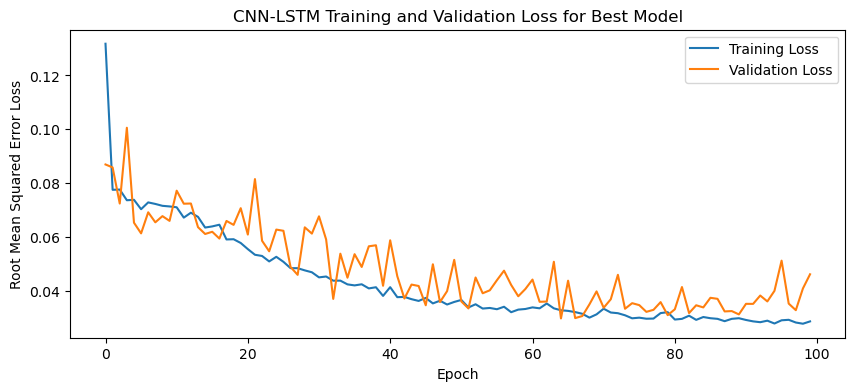

1/1 - 1s - loss: 0.0364 - 1s/epoch - 1s/step
Test Loss: 0.03642062470316887
1/1 [==============================] - 0s 39ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

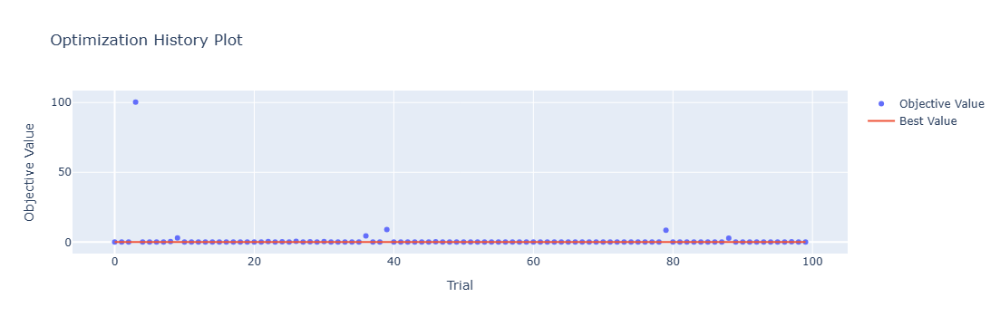

In [4]:
optuna.visualization.plot_optimization_history(study)

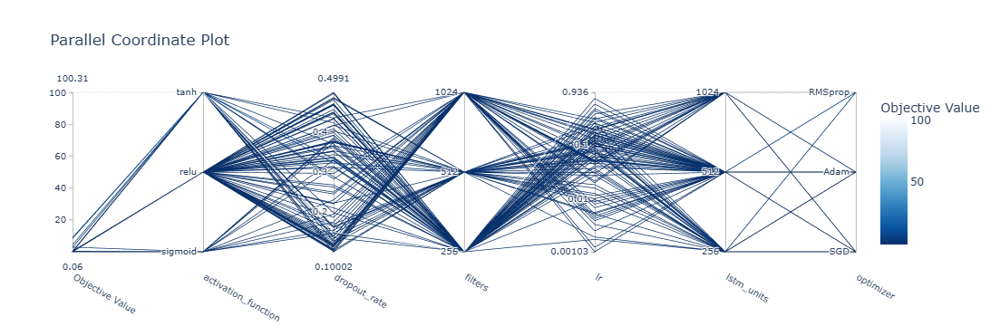

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

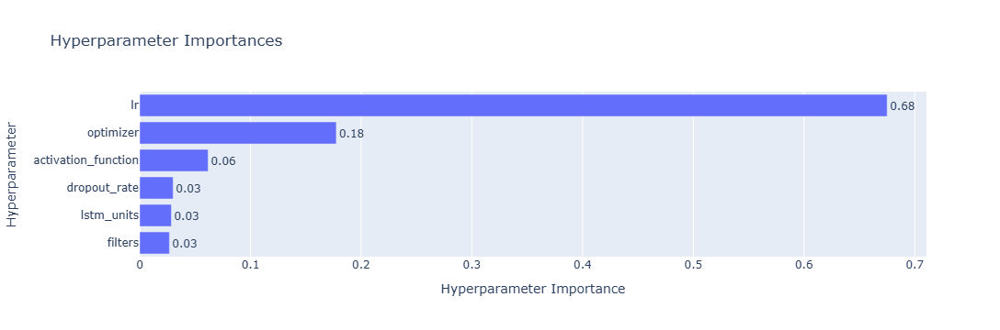

In [6]:
optuna.visualization.plot_param_importances(study)

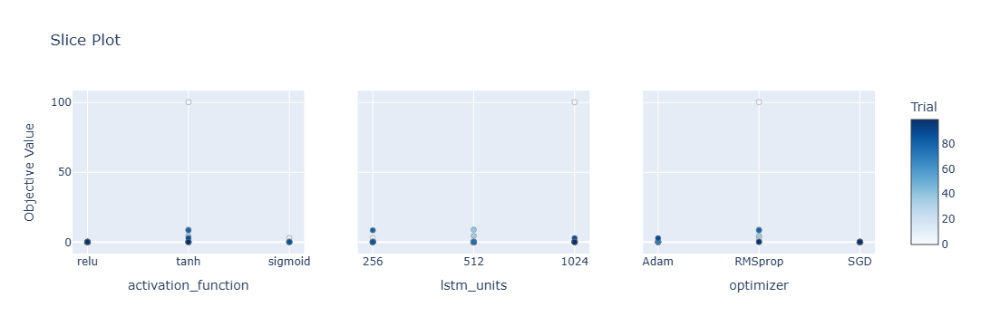

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

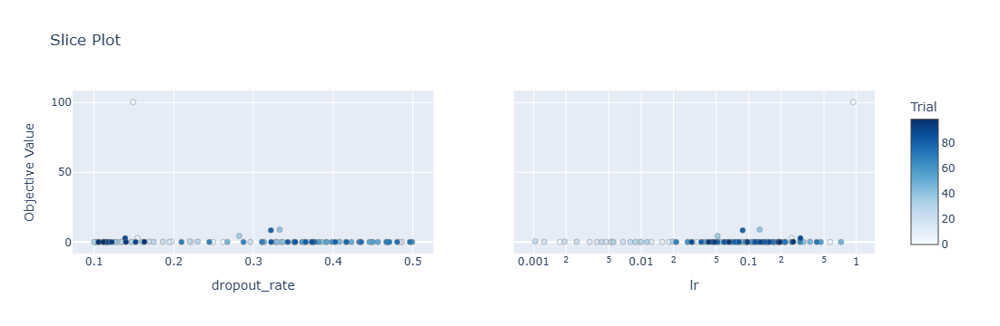

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 97s 1s/step - loss: 0.1220 - accuracy: 0.7024 - mae: 0.1051 - rmse: 0.1220 - mape: 17.7815 - pearson: 0.7142 - val_loss: 0.0747 - val_accuracy: 0.6000 - val_mae: 0.0601 - val_rmse: 0.0747 - val_mape: 11.0757 - val_pearson: 0.7870
Epoch 2/100
84/84 [==============================] - 25s 294ms/step - loss: 0.0790 - accuracy: 0.7500 - mae: 0.0630 - rmse: 0.0790 - mape: 11.0718 - pearson: 0.7746 - val_loss: 0.0769 - val_accuracy: 0.6000 - val_mae: 0.0643 - val_rmse: 0.0769 - val_mape: 11.0965 - val_pearson: 0.7324
Epoch 3/100
84/84 [==============================] - 34s 401ms/step - loss: 0.0781 - accuracy: 0.7381 - mae: 0.0627 - rmse: 0.0781 - mape: 10.8666 - pearson: 0.7755 - 

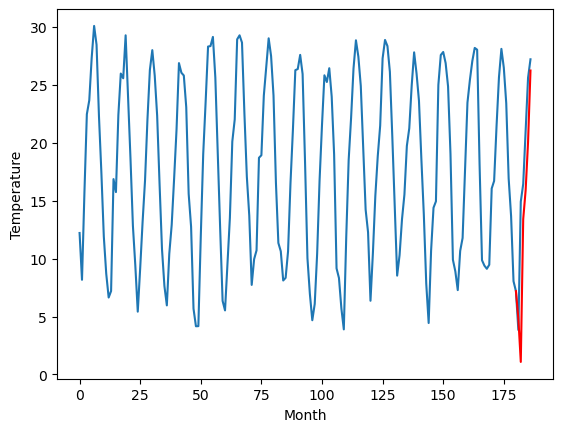

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		12.59		-0.28
12.78		12.68		-0.10
17.84		20.62		2.78
19.24		23.38		4.14
23.26		27.26		4.00
26.74		31.52		4.78
[180, 181, 182, 183, 184, 185, 186]
[13.23, 12.587826631069184, 12.675169452130795, 20.61688516944647, 23.381450637280942, 27.25616143554449, 31.52258323043585]


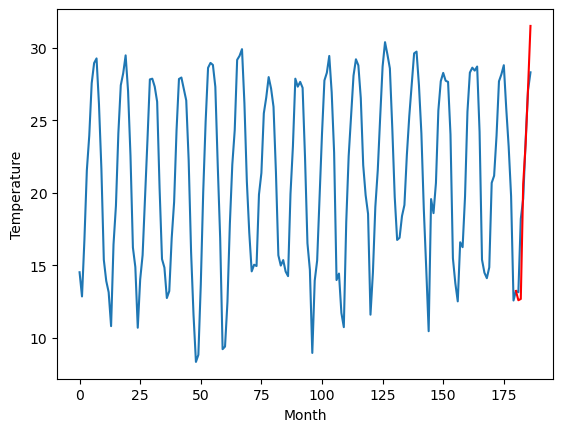

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		14.56		-0.78
16.20		13.81		-2.39
22.18		22.44		0.26
23.82		25.13		1.31
27.80		29.07		1.27
31.94		33.68		1.74
[180, 181, 182, 183, 184, 185, 186]
[7.18, 14.557742711603641, 13.81181132465601, 22.442055579721927, 25.12998783260584, 29.068507072031498, 33.680471774637695]


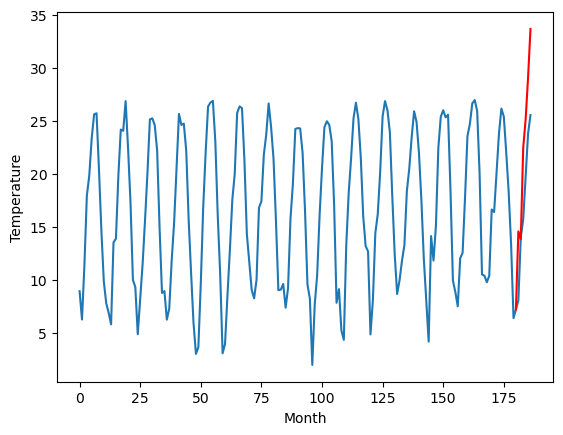

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		8.91		-0.09
7.43		7.05		-0.38
15.34		16.76		1.42
17.13		19.03		1.90
21.10		23.07		1.97
24.38		27.88		3.50
[180, 181, 182, 183, 184, 185, 186]
[11.46, 8.905867724530399, 7.046087412945926, 16.755622058026493, 19.034321217648685, 23.07434025298804, 27.88158360015601]


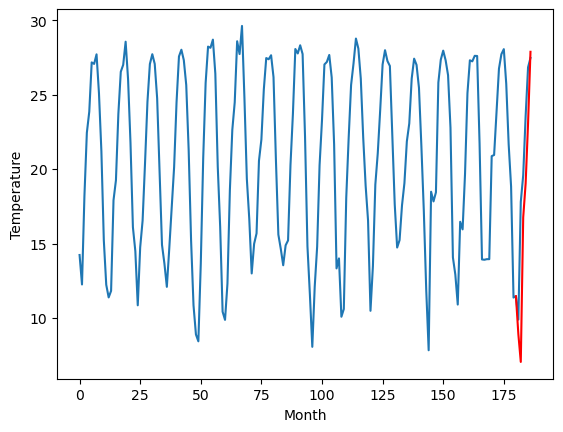

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.77		0.42
10.26		9.80		-0.46
20.16		22.26		2.10
22.09		24.79		2.70
25.95		29.07		3.12
31.15		35.36		4.21
[180, 181, 182, 183, 184, 185, 186]
[9.27, 13.770274888277054, 9.802025805711747, 22.256908427476883, 24.79013634800911, 29.067640792131424, 35.35814047932625]


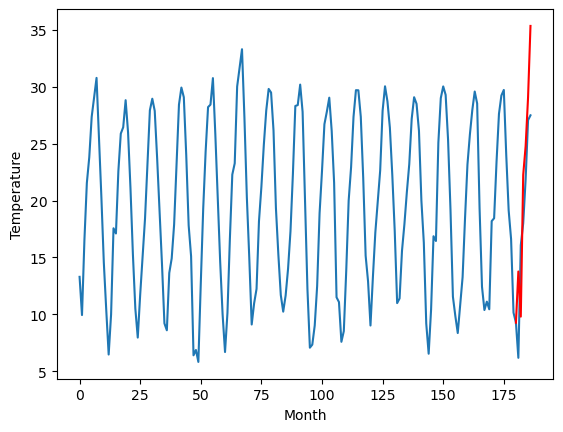

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		13.15		1.63
12.17		13.14		0.97
17.07		21.04		3.97
20.44		24.42		3.98
23.95		28.38		4.43
28.52		33.30		4.78
[180, 181, 182, 183, 184, 185, 186]
[7.77, 13.148506659269334, 13.13530516549945, 21.037082432955504, 24.422228097170592, 28.382662772387267, 33.297651290148494]


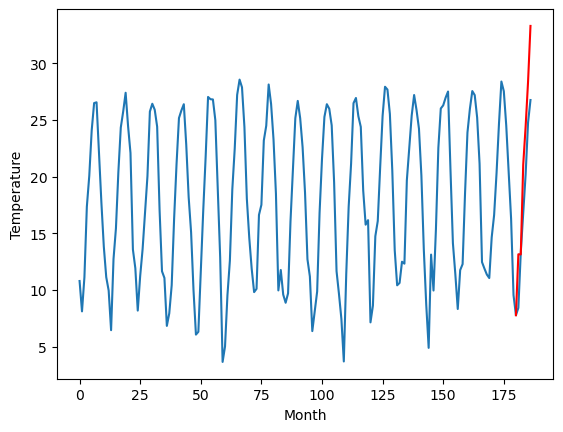

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		10.59		0.38
10.85		9.90		-0.95
17.83		18.49		0.66
18.86		21.49		2.63
22.57		25.47		2.90
26.90		30.40		3.50
[180, 181, 182, 183, 184, 185, 186]
[6.59, 10.592386492490768, 9.895969876050948, 18.48552657008171, 21.4921903693676, 25.470284708738326, 30.39575744509697]


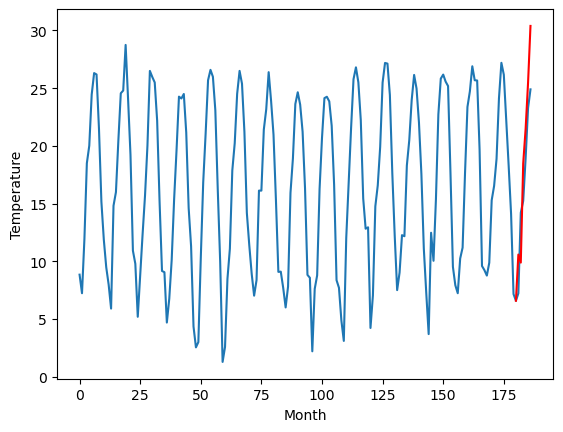

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		8.20		0.29
8.53		7.09		-1.44
15.05		16.08		1.03
18.68		19.40		0.72
21.70		23.33		1.63
26.49		28.78		2.29
[180, 181, 182, 183, 184, 185, 186]
[5.3, 8.20270369052887, 7.086169576644897, 16.08152804374695, 19.3965726852417, 23.332933521270753, 28.779717540740968]


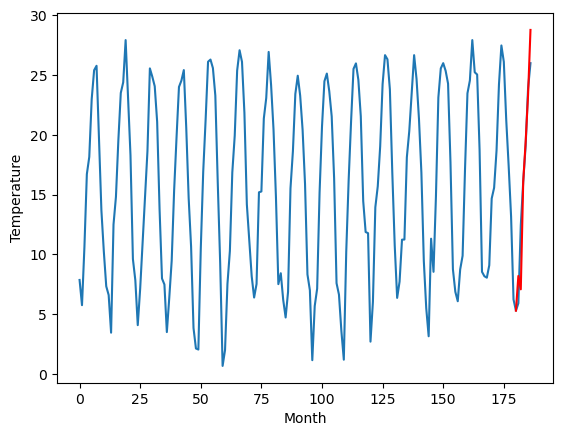

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		6.76		-0.32
2.81		2.31		-0.50
15.28		16.25		0.97
17.88		19.71		1.83
22.57		24.25		1.68
28.76		31.42		2.66
[180, 181, 182, 183, 184, 185, 186]
[3.1, 6.764883871078491, 2.3139470767974855, 16.254026765823365, 19.711106176376344, 24.25455319404602, 31.422298784255982]


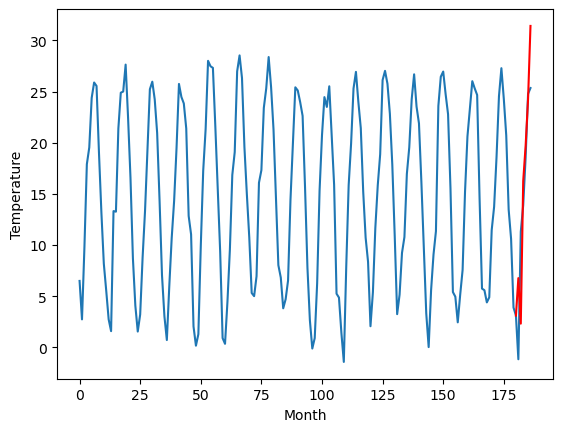

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		4.89		-0.01
2.73		1.13		-1.60
13.48		13.83		0.35
16.54		17.91		1.37
21.01		22.45		1.44
27.49		29.82		2.33
[180, 181, 182, 183, 184, 185, 186]
[0.6, 4.8872374200820925, 1.1279522085189821, 13.833224883079529, 17.905425658226015, 22.447497000694277, 29.81756555080414]


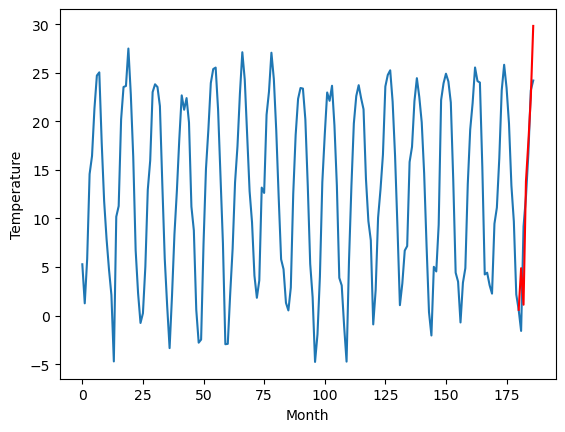

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		3.16		-0.52
-0.63		-1.42		-0.79
11.10		12.21		1.11
15.07		17.08		2.01
20.22		22.29		2.07
27.53		30.51		2.98
[180, 181, 182, 183, 184, 185, 186]
[-0.75, 3.162109651565552, -1.4236304378509521, 12.206239976882934, 17.084227838516234, 22.286965169906615, 30.51160029411316]


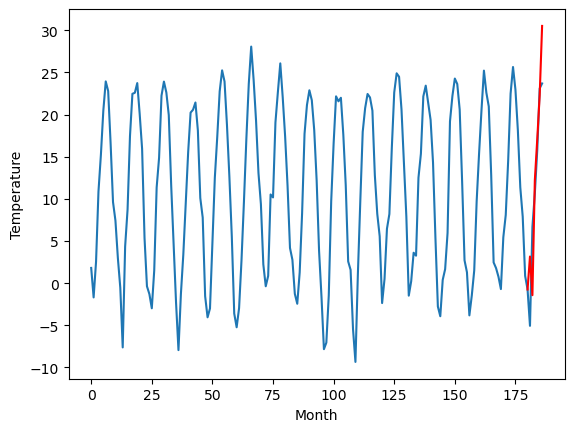

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   4.818602
1                 1   12.87  12.587827
2                 2   15.34  14.557743
3                 3    9.00   8.905868
4                 4   13.35  13.770275
5                 5   11.52  13.148507
6                 6   10.21  10.592386
7                 7    7.91   8.202704
8                 8    7.08   6.764884
9                 9    4.90   4.887237
10               10    3.68   3.162110


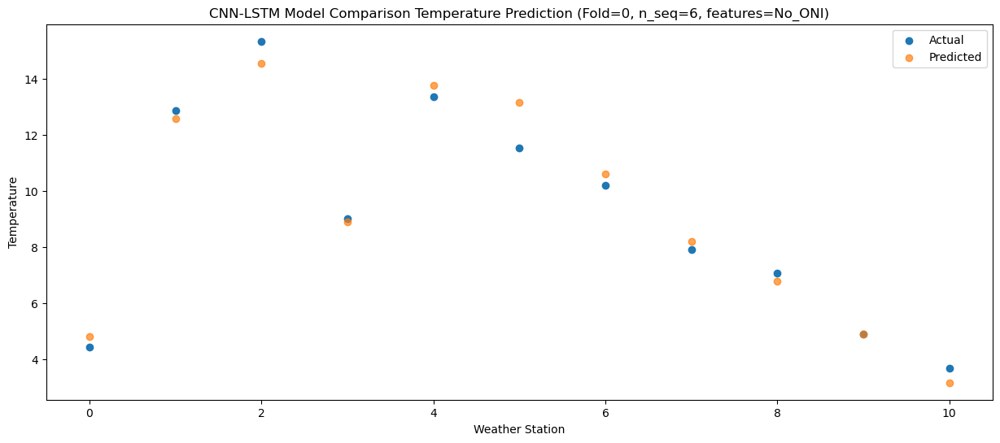

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   1.082577
1                 1   12.78  12.675169
2                 2   16.20  13.811811
3                 3    7.43   7.046087
4                 4   10.26   9.802026
5                 5   12.17  13.135305
6                 6   10.85   9.895970
7                 7    8.53   7.086170
8                 8    2.81   2.313947
9                 9    2.73   1.127952
10               10   -0.63  -1.423630


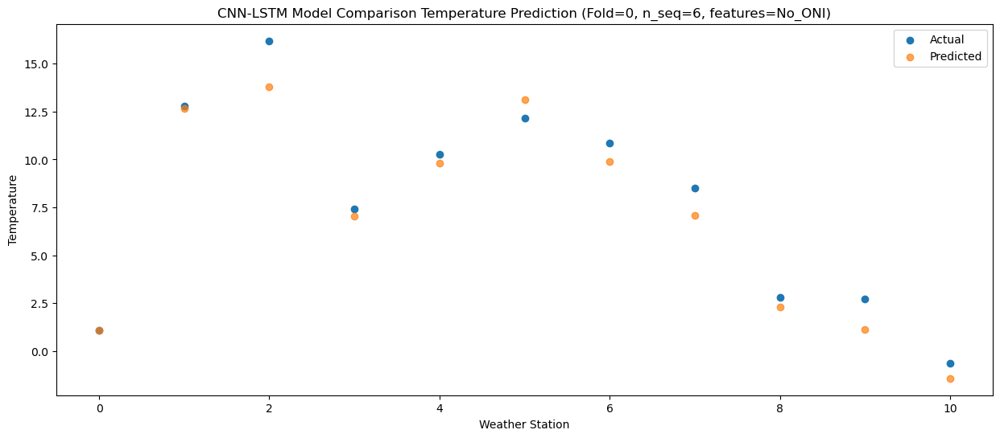

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  13.405187
1                 1   17.84  20.616885
2                 2   22.18  22.442056
3                 3   15.34  16.755622
4                 4   20.16  22.256908
5                 5   17.07  21.037082
6                 6   17.83  18.485527
7                 7   15.05  16.081528
8                 8   15.28  16.254027
9                 9   13.48  13.833225
10               10   11.10  12.206240


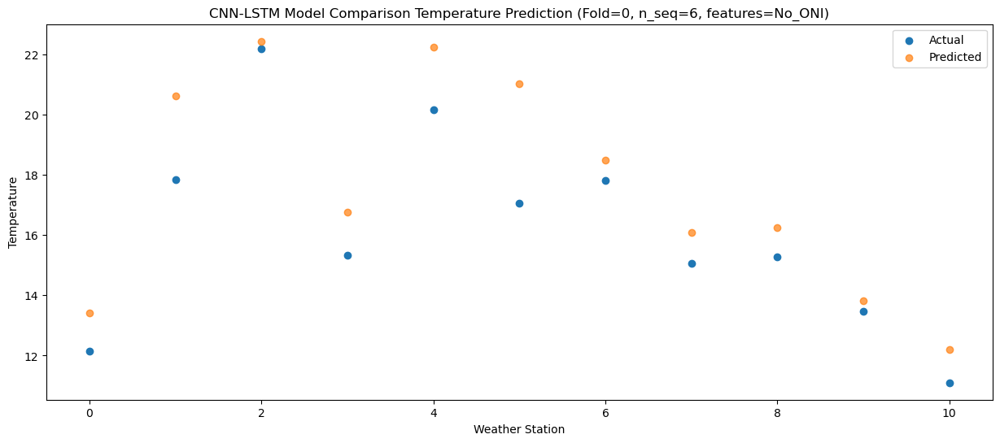

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  15.891744
1                 1   19.24  23.381451
2                 2   23.82  25.129988
3                 3   17.13  19.034321
4                 4   22.09  24.790136
5                 5   20.44  24.422228
6                 6   18.86  21.492190
7                 7   18.68  19.396573
8                 8   17.88  19.711106
9                 9   16.54  17.905426
10               10   15.07  17.084228


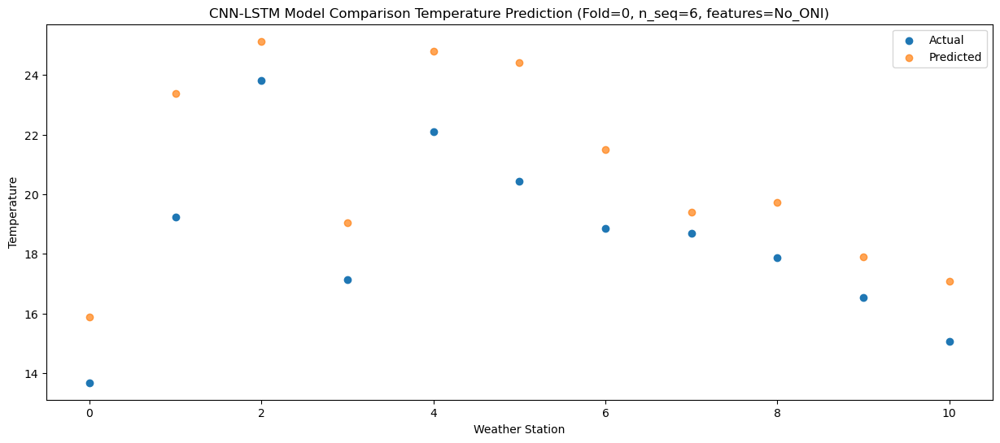

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  20.071909
1                 1   23.26  27.256161
2                 2   27.80  29.068507
3                 3   21.10  23.074340
4                 4   25.95  29.067641
5                 5   23.95  28.382663
6                 6   22.57  25.470285
7                 7   21.70  23.332934
8                 8   22.57  24.254553
9                 9   21.01  22.447497
10               10   20.22  22.286965


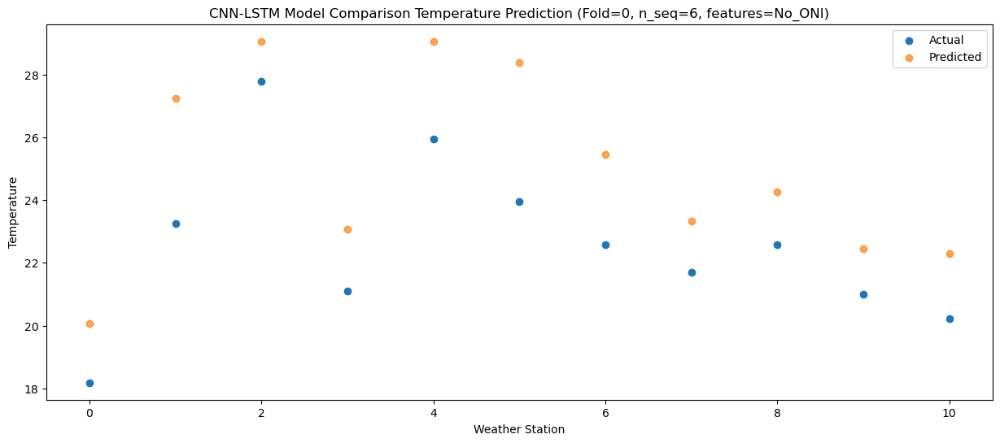

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  26.230536
1                 1   26.74  31.522583
2                 2   31.94  33.680472
3                 3   24.38  27.881584
4                 4   31.15  35.358140
5                 5   28.52  33.297651
6                 6   26.90  30.395757
7                 7   26.49  28.779718
8                 8   28.76  31.422299
9                 9   27.49  29.817566
10               10   27.53  30.511600


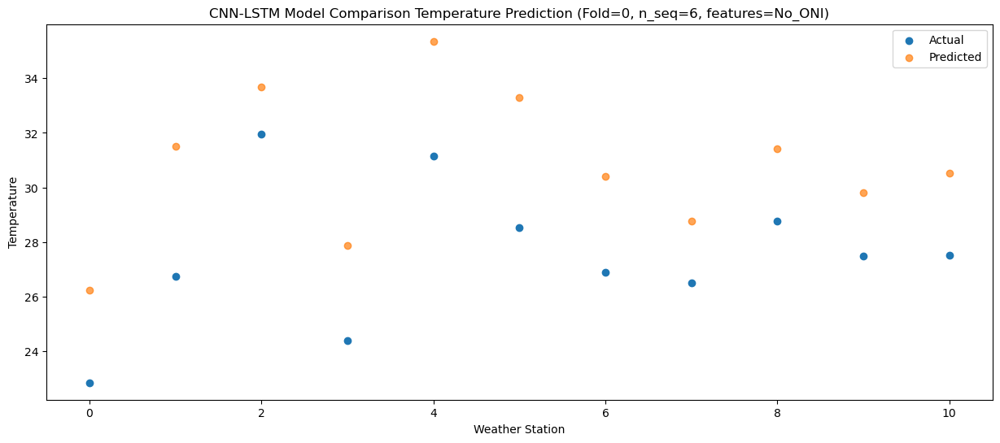

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]]
[[ 4.81860186 12.58782663 14.55774271  8.90586772 13.77027489 13.14850666
  10.59238649  8.20270369  6.76488387  4.88723742  3.16210965]
 [ 1.08257724 12.67516945 13.81181132  7.04608741  9.80202581 13.13530517
   9.89596988  7.08616958  2.31394708  1.12795221 -1.42363044]
 [13.40518714 20.61688517 22.44205558 16.75562206 22.25690843 21.03708243
  18.48552657 16.08152804 16.25402677 13.83322488 12.20623998]
 [15.89174438 23.38145064 25.12998783 19.03432122 24.79013635 24.4222281
  21.49219037 19.39657269 19.71110618 17.90542566 17.08422784]
 [20.07190872 27.25616144 29.068

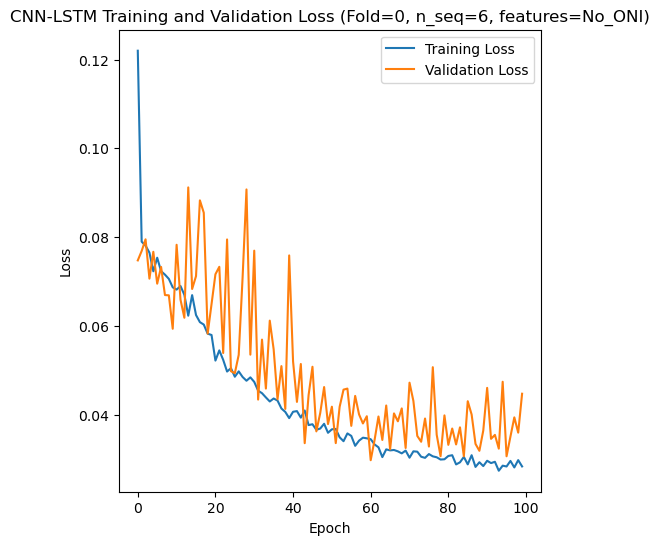

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 30s 238ms/step - loss: 0.1257 - accuracy: 0.5357 - mae: 0.1089 - rmse: 0.1257 - mape: 18.5313 - pearson: 0.6714 - val_loss: 0.0879 - val_accuracy: 0.8000 - val_mae: 0.0712 - val_rmse: 0.0879 - val_mape: 11.8007 - val_pearson: 0.7621
Epoch 2/100
84/84 [==============================] - 15s 181ms/step - loss: 0.0805 - accuracy: 0.6429 - mae: 0.0644 - rmse: 0.0805 - mape: 11.0513 - pearson: 0.7682 - val_loss: 0.0812 - val_accuracy: 0.8000 - val_mae: 0.0681 - val_rmse: 0.0812 - val_mape: 11.2773 - val_pearson: 0.8006
Epoch 3/100
84/84 [==============================] - 17s 200ms/step - loss: 0.0751 - accuracy: 0.6429 - mae: 0.0615 - rmse: 0.0751 - mape: 10.7818 - pearson: 0.7729

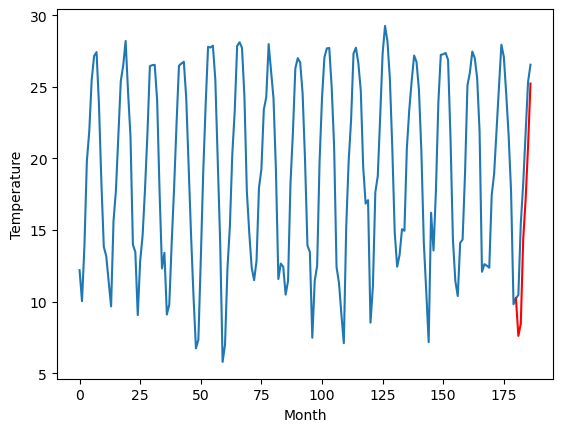

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		11.54		-0.46
12.66		11.78		-0.88
19.43		19.39		-0.04
21.57		21.93		0.36
25.30		25.61		0.31
29.44		30.19		0.75
[180, 181, 182, 183, 184, 185, 186]
[6.41, 11.535634768009185, 11.783659559488296, 19.39489613175392, 21.930128914117812, 25.606078487634658, 30.192340713739394]


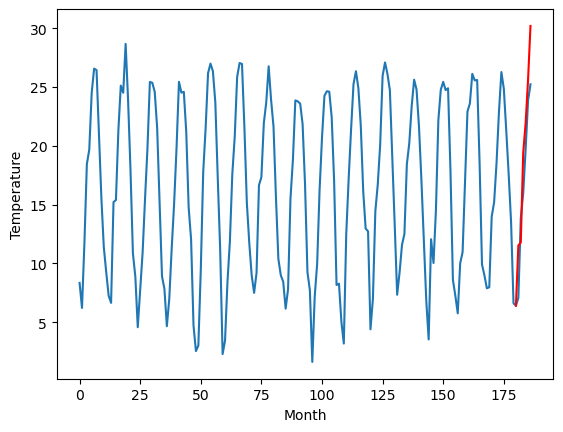

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		8.04		-0.73
9.26		7.86		-1.40
16.32		15.65		-0.67
17.72		17.72		0.00
21.84		21.51		-0.33
25.72		25.72		0.00
[180, 181, 182, 183, 184, 185, 186]
[7.6, 8.04288557767868, 7.855683168768882, 15.64600404202938, 17.72049387395382, 21.50991757810116, 25.72486718595028]


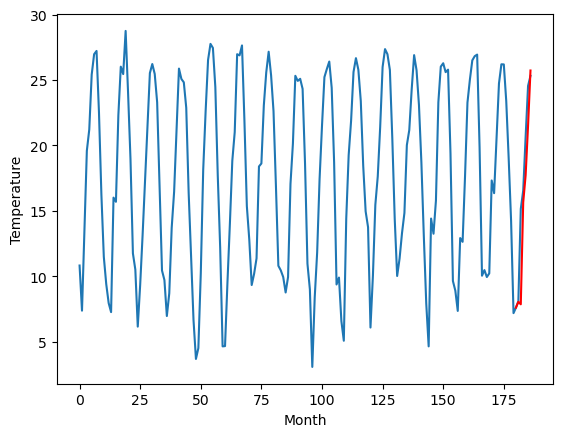

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		10.15		-0.57
9.13		7.98		-1.15
16.50		17.64		1.14
18.84		19.53		0.69
22.73		23.57		0.84
26.62		28.45		1.83
[180, 181, 182, 183, 184, 185, 186]
[11.89, 10.153652496337891, 7.980899639129639, 17.643378086090088, 19.530715532302857, 23.570285387039185, 28.45126826286316]


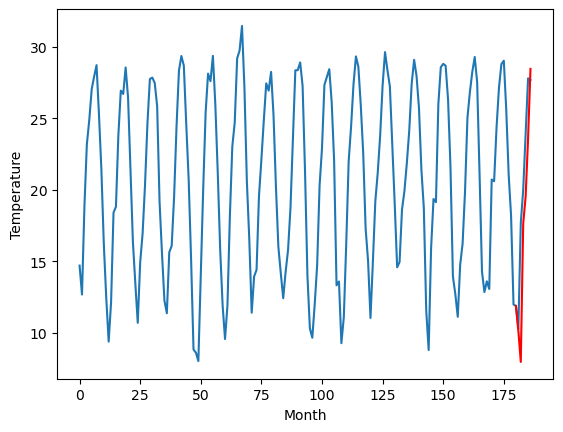

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		14.01		-0.69
13.00		11.64		-1.36
20.61		21.59		0.98
22.91		23.48		0.57
27.03		27.51		0.48
30.50		32.48		1.98
[180, 181, 182, 183, 184, 185, 186]
[10.96, 14.007298669815064, 11.644147119522096, 21.59002610206604, 23.476165971755982, 27.506589612960816, 32.47684880256653]


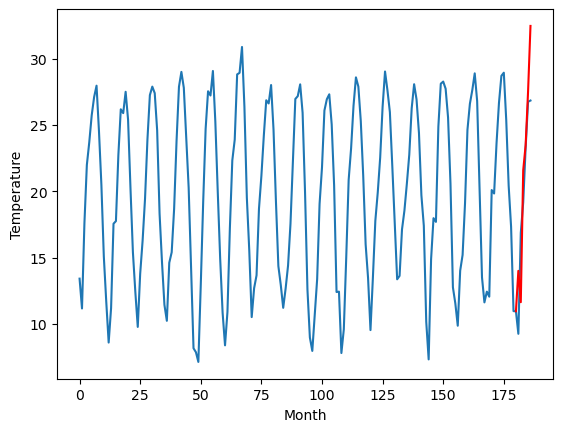

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		12.61		0.70
12.29		11.06		-1.23
19.63		19.06		-0.57
21.90		22.34		0.44
27.49		26.68		-0.81
31.76		32.69		0.93
[180, 181, 182, 183, 184, 185, 186]
[7.75, 12.607419295310974, 11.055149717330933, 19.064421339035036, 22.337532205581667, 26.67524115562439, 32.693680925369264]


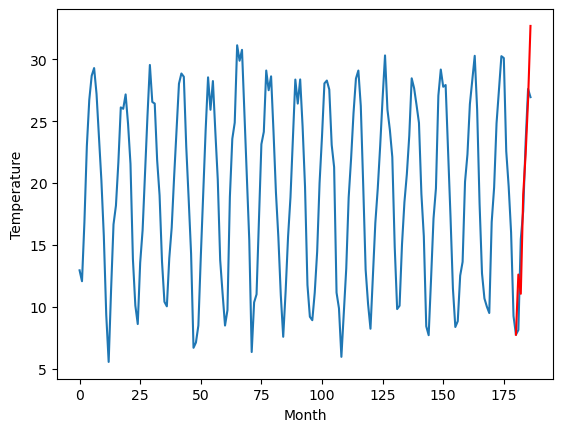

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		12.17		-0.58
13.53		12.51		-1.02
19.81		19.97		0.16
22.38		22.68		0.30
26.15		26.42		0.27
30.16		31.11		0.95
[180, 181, 182, 183, 184, 185, 186]
[6.17, 12.174606692790984, 12.509306889772414, 19.974901181459426, 22.679070216417312, 26.41930530667305, 31.107048493623733]


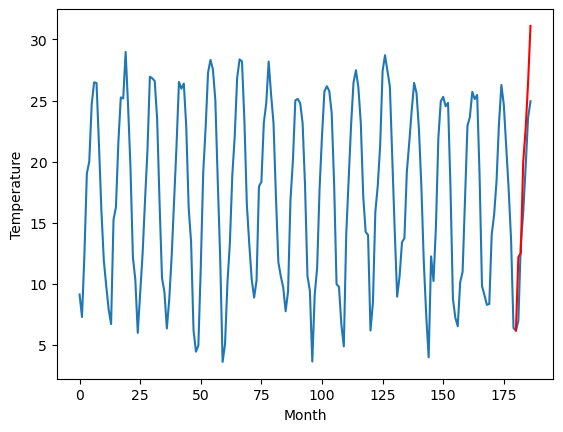

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		7.76		-1.05
5.81		4.07		-1.74
17.13		16.71		-0.42
18.84		19.19		0.35
23.50		23.25		-0.25
29.58		29.62		0.04
[180, 181, 182, 183, 184, 185, 186]
[4.57, 7.756690735816955, 4.066460604667663, 16.705638880729673, 19.186765666007993, 23.253864283561704, 29.615673060417173]


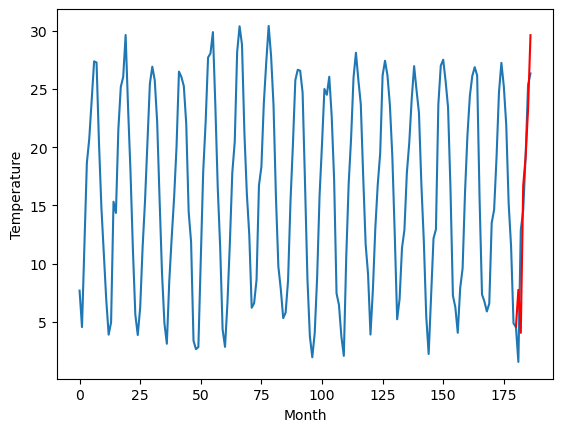

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.35		-0.99
2.56		2.03		-0.53
15.12		15.18		0.06
16.92		17.80		0.88
21.73		22.23		0.50
27.76		29.14		1.38
[180, 181, 182, 183, 184, 185, 186]
[5.46, 6.345215978622437, 2.0335924053192143, 15.176369848251344, 17.801297607421876, 22.230611267089845, 29.136044445037843]


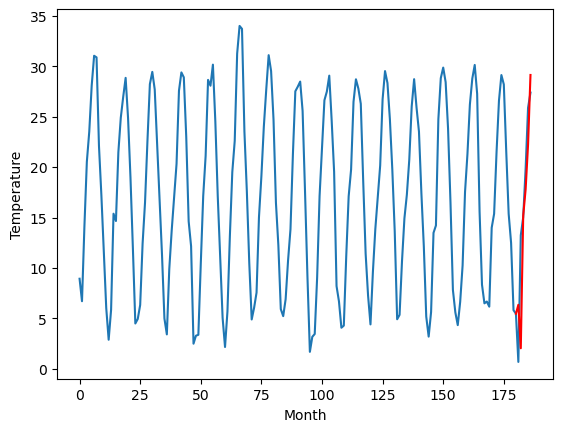

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		7.75		-1.29
4.67		3.24		-1.43
15.38		15.11		-0.27
19.14		18.24		-0.90
23.69		23.25		-0.44
30.80		30.91		0.11
[180, 181, 182, 183, 184, 185, 186]
[5.42, 7.748538069725036, 3.2423663663864133, 15.111050181388855, 18.236111931800842, 23.254813961982727, 30.908646874427795]


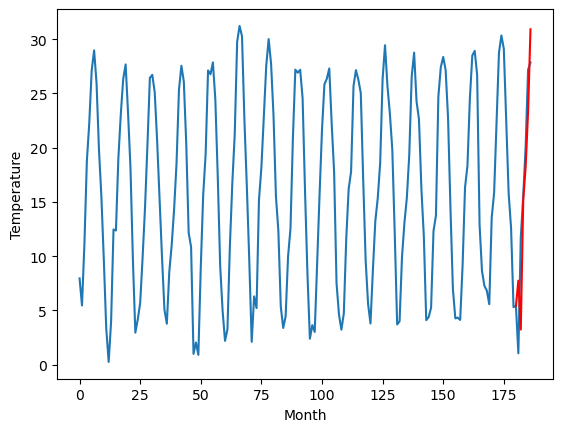

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		5.00		-1.12
5.16		3.83		-1.33
12.38		11.76		-0.62
17.03		16.64		-0.39
21.57		21.80		0.23
27.66		28.58		0.92
[180, 181, 182, 183, 184, 185, 186]
[2.17, 5.0022234535217285, 3.831107220649719, 11.758439145088197, 16.639709553718568, 21.804016671180726, 28.584497056007386]


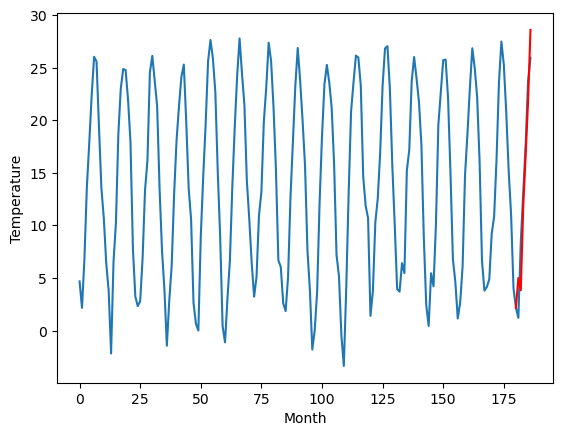

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   7.611117
1                 1   12.00  11.535635
2                 2    8.77   8.042886
3                 3   10.72  10.153652
4                 4   14.70  14.007299
5                 5   11.91  12.607419
6                 6   12.75  12.174607
7                 7    8.81   7.756691
8                 8    7.34   6.345216
9                 9    9.04   7.748538
10               10    6.12   5.002223


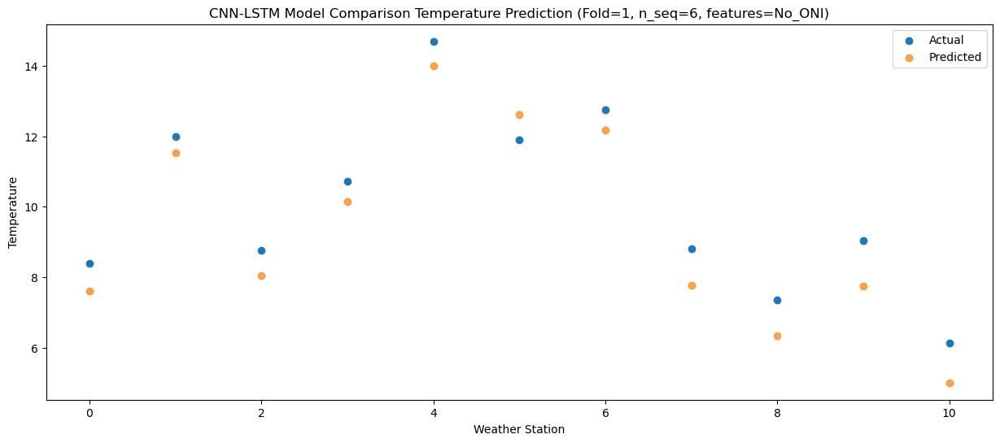

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   8.449041
1                 1   12.66  11.783660
2                 2    9.26   7.855683
3                 3    9.13   7.980900
4                 4   13.00  11.644147
5                 5   12.29  11.055150
6                 6   13.53  12.509307
7                 7    5.81   4.066461
8                 8    2.56   2.033592
9                 9    4.67   3.242366
10               10    5.16   3.831107


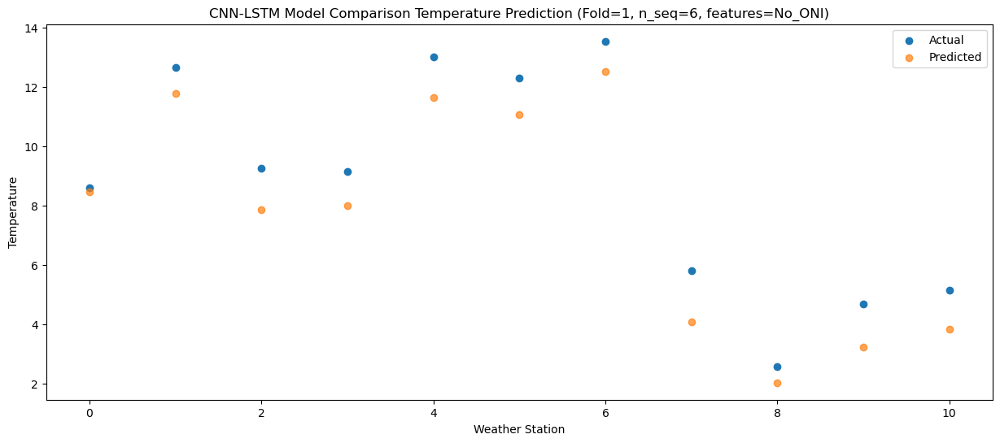

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  14.354844
1                 1   19.43  19.394896
2                 2   16.32  15.646004
3                 3   16.50  17.643378
4                 4   20.61  21.590026
5                 5   19.63  19.064421
6                 6   19.81  19.974901
7                 7   17.13  16.705639
8                 8   15.12  15.176370
9                 9   15.38  15.111050
10               10   12.38  11.758439


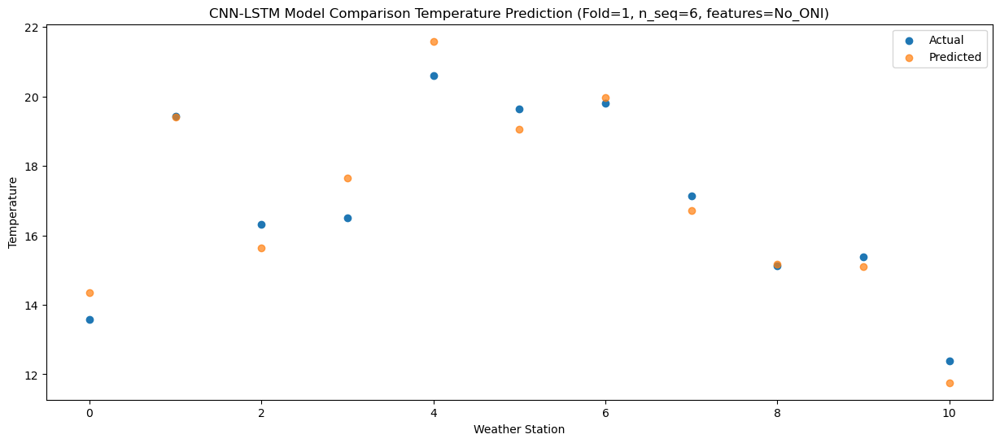

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  17.143998
1                 1   21.57  21.930129
2                 2   17.72  17.720494
3                 3   18.84  19.530716
4                 4   22.91  23.476166
5                 5   21.90  22.337532
6                 6   22.38  22.679070
7                 7   18.84  19.186766
8                 8   16.92  17.801298
9                 9   19.14  18.236112
10               10   17.03  16.639710


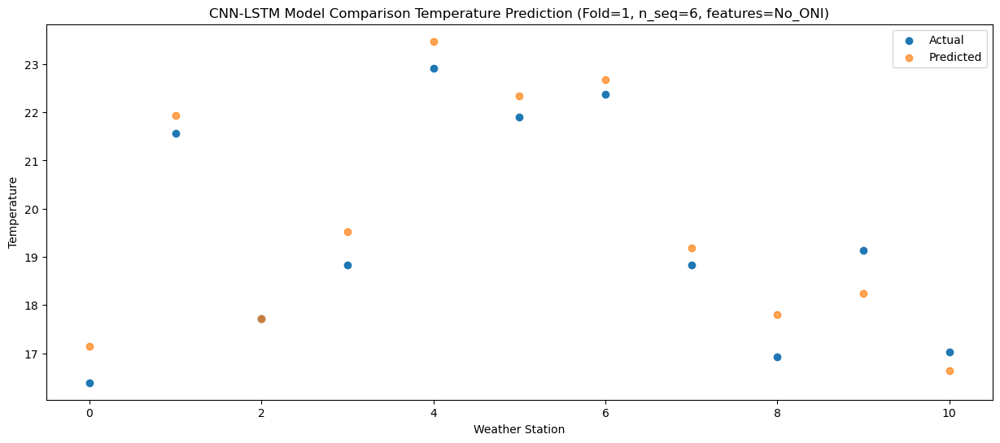

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  20.850310
1                 1   25.30  25.606078
2                 2   21.84  21.509918
3                 3   22.73  23.570285
4                 4   27.03  27.506590
5                 5   27.49  26.675241
6                 6   26.15  26.419305
7                 7   23.50  23.253864
8                 8   21.73  22.230611
9                 9   23.69  23.254814
10               10   21.57  21.804017


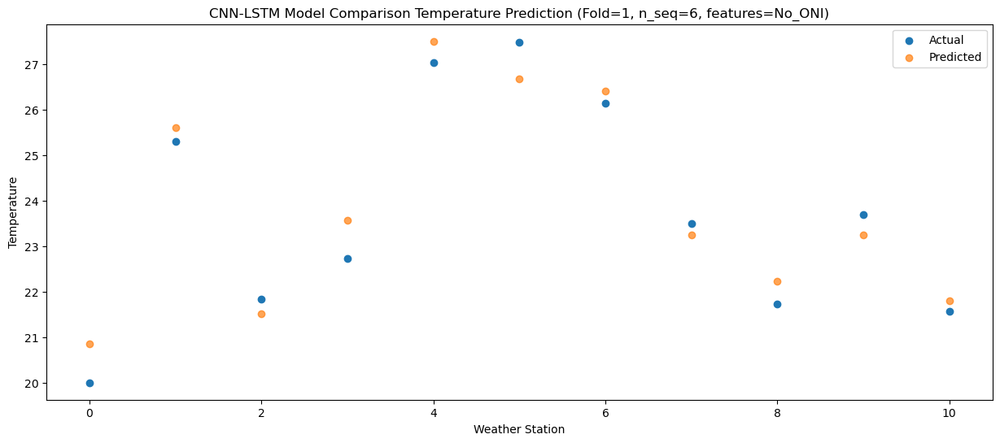

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  25.234990
1                 1   29.44  30.192341
2                 2   25.72  25.724867
3                 3   26.62  28.451268
4                 4   30.50  32.476849
5                 5   31.76  32.693681
6                 6   30.16  31.107048
7                 7   29.58  29.615673
8                 8   27.76  29.136044
9                 9   30.80  30.908647
10               10   27.66  28.584497


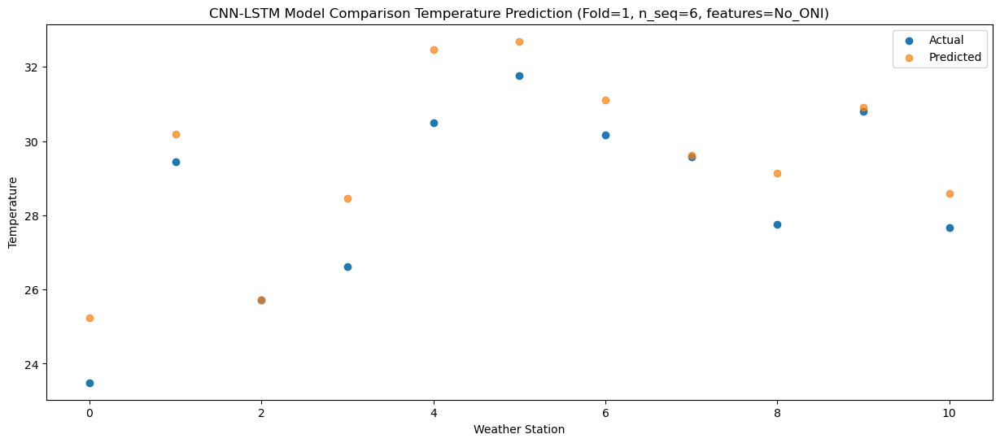

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]]
[[ 7.61111727 11.53563477  8.04288558 10.1536525  14.00729867 12.6074193
  12.17460669  7.75669074  6.34521598  7.74853807  5.00222345]
 [ 8.44904127 11.78365956  7.85568317  7.98089964 11.64414712 11.05514972
  12.50930689  4.0664606   2.03359241  3.24236637  3.83110722]
 [14.35484447 19.39489613 15.64600404 17.64337809 21.5900261  19.06442134
  19.97490118 16.70563888 15.17636985 15.11105018 11.75843915]
 [17.14399829 21.93012891 17.72049387 19.53071553 23.47616597 22.33753221
  22.67907022 19.18676567 17.80129761 18.23611193 16.63970955]
 [20.85030999 25.60607849 21.509

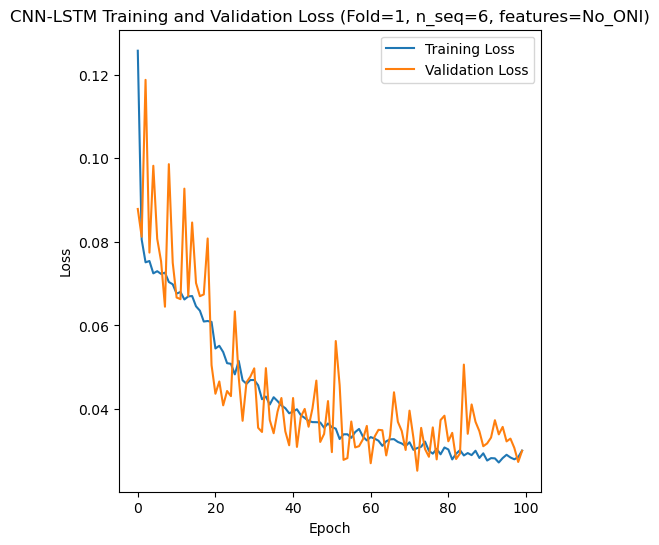

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 36s 220ms/step - loss: 0.1450 - accuracy: 0.6429 - mae: 0.1274 - rmse: 0.1450 - mape: 21.3032 - pearson: 0.6570 - val_loss: 0.0537 - val_accuracy: 0.9000 - val_mae: 0.0422 - val_rmse: 0.0537 - val_mape: 7.7137 - val_pearson: 0.9242
Epoch 2/100
84/84 [==============================] - 15s 184ms/step - loss: 0.0773 - accuracy: 0.7024 - mae: 0.0614 - rmse: 0.0773 - mape: 10.8334 - pearson: 0.7825 - val_loss: 0.0456 - val_accuracy: 0.9000 - val_mae: 0.0369 - val_rmse: 0.0456 - val_mape: 6.0711 - val_pearson: 0.9423
Epoch 3/100
84/84 [==============================] - 15s 181ms/step - loss: 0.0774 - accuracy: 0.7738 - mae: 0.0621 - rmse: 0.0774 - mape: 10.9798 - pearson: 0.7950 -

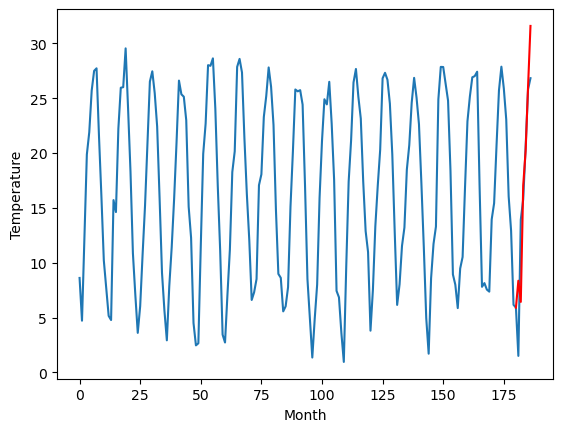

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.60		0.07
4.49		5.64		1.15
14.68		16.41		1.73
18.44		20.76		2.32
23.62		27.33		3.71
30.87		34.97		4.10
[180, 181, 182, 183, 184, 185, 186]
[2.63, 8.598591942936181, 5.642754693180322, 16.407797951847314, 20.756119389683008, 27.327474732547998, 34.971950669437646]


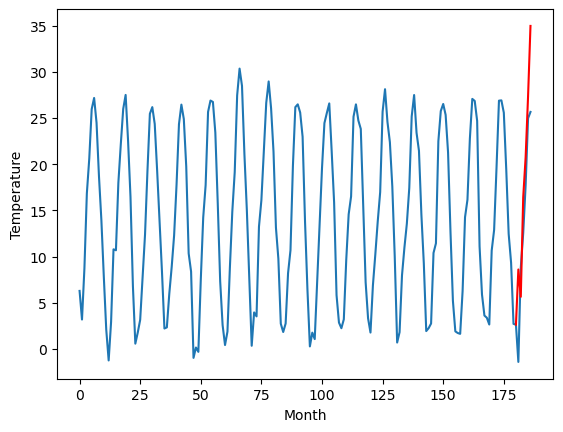

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		7.11		0.17
9.67		10.08		0.41
11.48		12.43		0.95
13.29		15.80		2.51
16.87		20.26		3.39
18.09		23.09		5.00
[180, 181, 182, 183, 184, 185, 186]
[16.55, 7.111360161304474, 10.080420582294465, 12.425508110523225, 15.800011007785798, 20.262900679111482, 23.086757509708406]


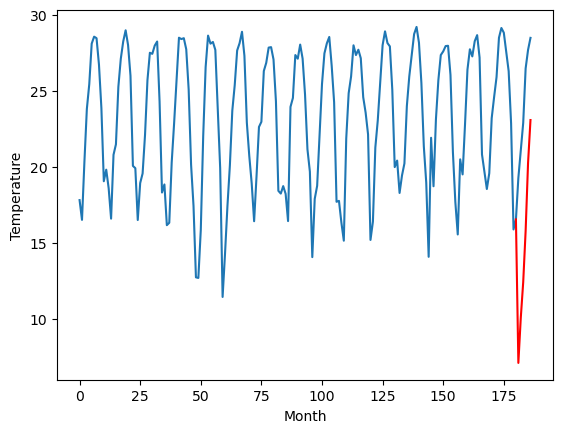

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		16.51		1.77
14.76		16.69		1.93
18.87		22.46		3.59
23.37		29.08		5.71
28.63		35.30		6.67
34.20		42.74		8.54
[180, 181, 182, 183, 184, 185, 186]
[-0.83, 16.509683437347412, 16.693296946287155, 22.45843747973442, 29.080907858610153, 35.30464223742485, 42.74038127779961]


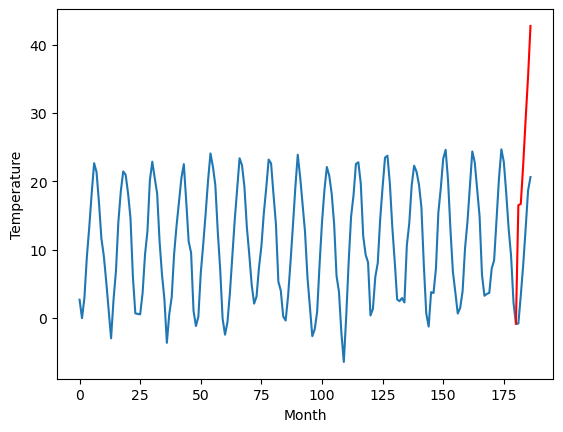

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		3.36		0.33
2.29		4.04		1.75
9.62		11.01		1.39
10.49		14.07		3.58
14.96		19.62		4.66
18.44		23.68		5.24
[180, 181, 182, 183, 184, 185, 186]
[11.52, 3.356119923591614, 4.038972132205963, 11.013999693393707, 14.068630926609039, 19.61719345331192, 23.679057352542877]


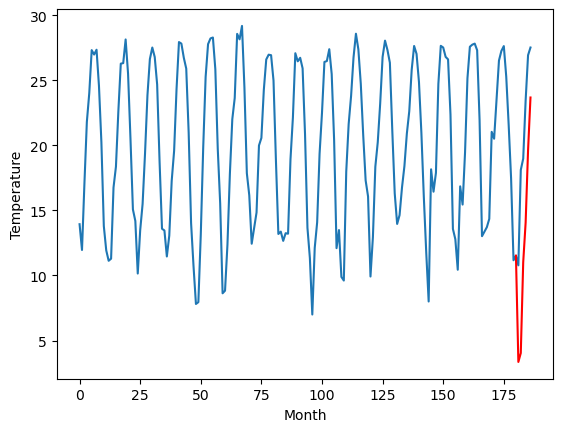

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.25		0.90
11.00		13.56		2.56
19.38		22.09		2.71
21.50		25.06		3.56
25.54		30.90		5.36
30.09		35.47		5.38
[180, 181, 182, 183, 184, 185, 186]
[11.47, 14.245276811122894, 13.56417209148407, 22.086684527397153, 25.063511433601377, 30.898886265754697, 35.46898371219635]


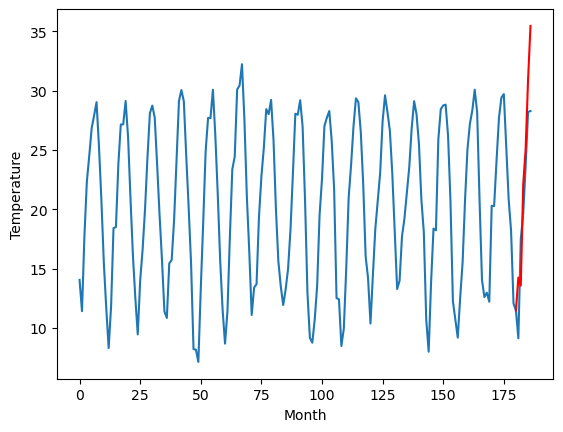

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.04		0.69
10.24		12.06		1.82
20.61		22.48		1.87
22.31		25.45		3.14
26.39		31.26		4.87
31.95		36.49		4.54
[180, 181, 182, 183, 184, 185, 186]
[7.75, 14.044590342044831, 12.064714539051057, 22.479711639881135, 25.44564448595047, 31.257606613636018, 36.4914170384407]


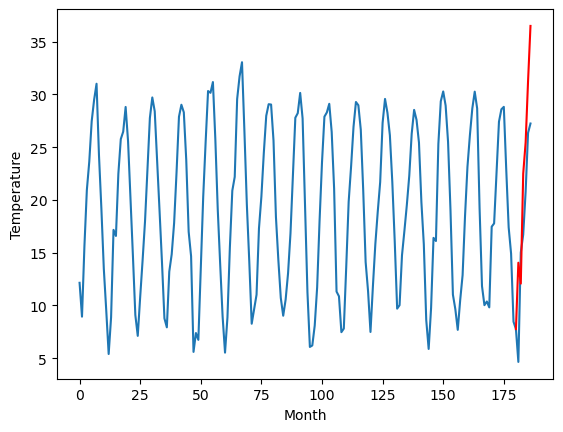

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		12.94		0.26
15.60		14.36		-1.24
18.70		17.78		-0.92
25.36		23.19		-2.17
30.37		28.51		-1.86
35.36		34.68		-0.68
[180, 181, 182, 183, 184, 185, 186]
[4.9, 12.944560601711274, 14.363263561725617, 17.778469994068146, 23.194533779621125, 28.514252617359162, 34.675599529743195]


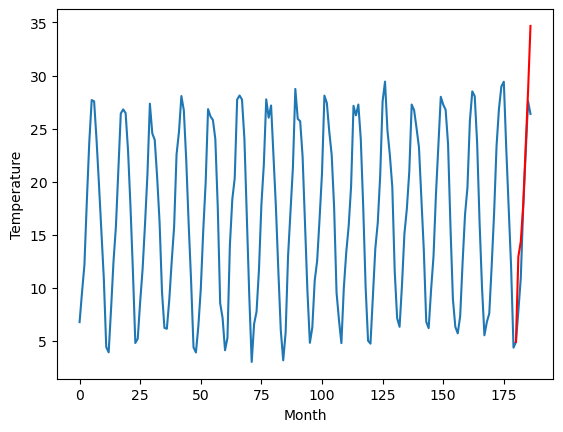

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		7.88		1.17
5.79		9.58		3.79
5.39		10.83		5.44
9.25		17.10		7.85
11.47		22.24		10.77
15.71		28.13		12.42
[180, 181, 182, 183, 184, 185, 186]
[14.14, 7.8828513813018795, 9.577117700576782, 10.828685660362243, 17.09738196849823, 22.24225844860077, 28.13465871334076]


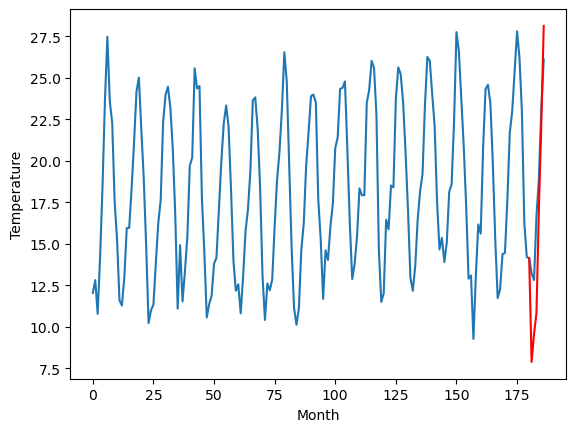

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		12.26		0.63
12.13		13.17		1.04
19.01		19.96		0.95
21.80		23.66		1.86
25.82		29.02		3.20
30.11		33.83		3.72
[180, 181, 182, 183, 184, 185, 186]
[5.55, 12.256425165534019, 13.169488751292228, 19.96135028541088, 23.65772994697094, 29.022041165232658, 33.82916482627392]


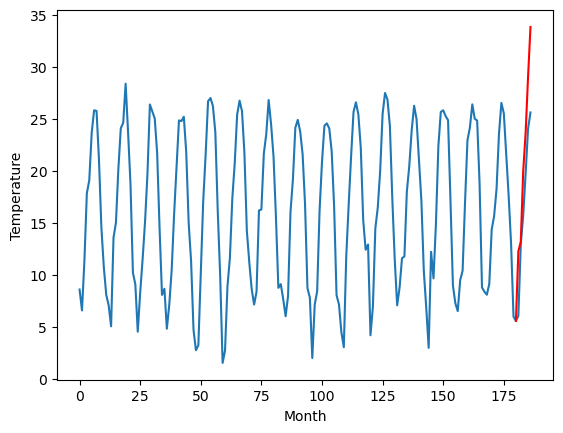

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		8.48		-0.42
10.25		8.96		-1.29
16.46		16.43		-0.03
18.43		20.40		1.97
23.34		25.90		2.56
28.75		31.13		2.38
[180, 181, 182, 183, 184, 185, 186]
[3.19, 8.47984357148409, 8.956986203491688, 16.42599607974291, 20.40476347476244, 25.89948774844408, 31.132624879181385]


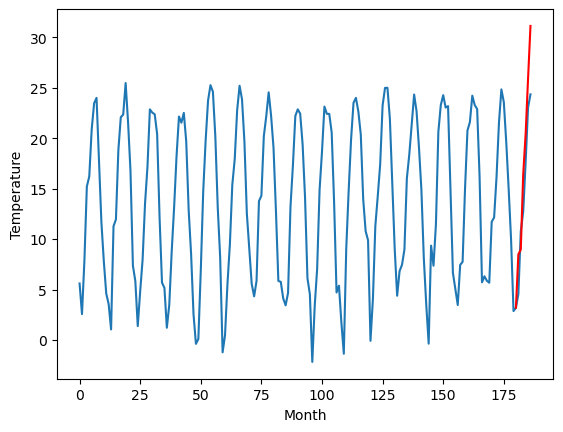

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   8.355919
1                 1    8.53   8.598592
2                 2    6.94   7.111360
3                 3   14.74  16.509683
4                 4    3.03   3.356120
5                 5   13.35  14.245277
6                 6   13.35  14.044590
7                 7   12.68  12.944561
8                 8    6.71   7.882851
9                 9   11.63  12.256425
10               10    8.90   8.479844


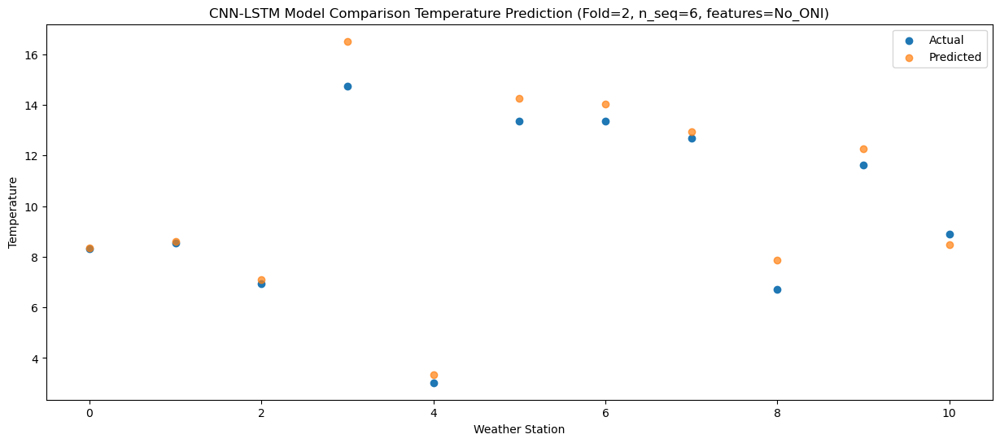

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   6.425929
1                 1    4.49   5.642755
2                 2    9.67  10.080421
3                 3   14.76  16.693297
4                 4    2.29   4.038972
5                 5   11.00  13.564172
6                 6   10.24  12.064715
7                 7   15.60  14.363264
8                 8    5.79   9.577118
9                 9   12.13  13.169489
10               10   10.25   8.956986


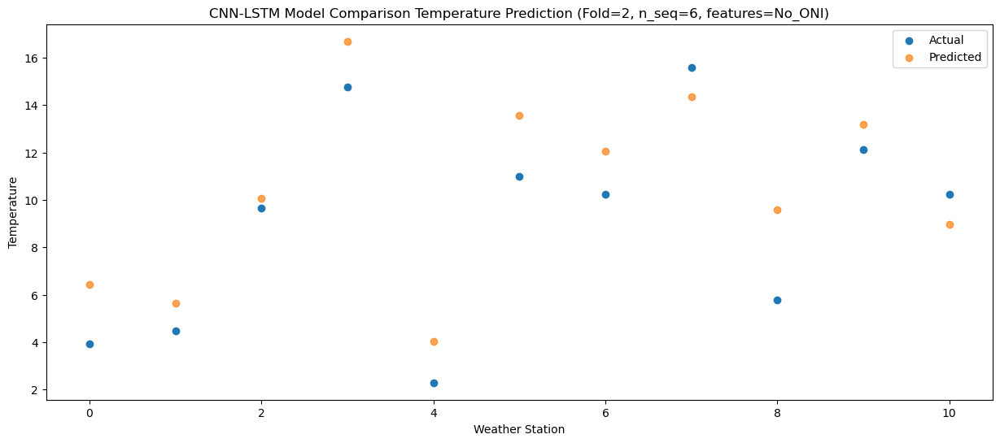

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  17.037753
1                 1   14.68  16.407798
2                 2   11.48  12.425508
3                 3   18.87  22.458437
4                 4    9.62  11.014000
5                 5   19.38  22.086685
6                 6   20.61  22.479712
7                 7   18.70  17.778470
8                 8    5.39  10.828686
9                 9   19.01  19.961350
10               10   16.46  16.425996


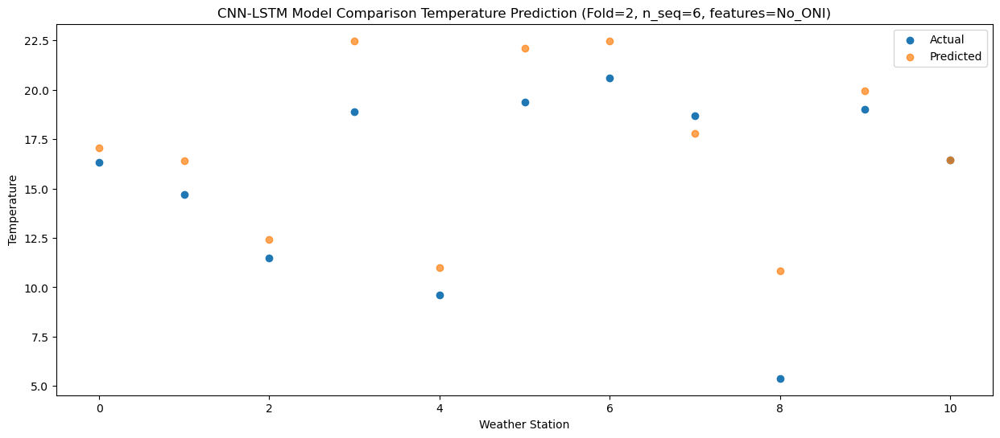

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  20.219465
1                 1   18.44  20.756119
2                 2   13.29  15.800011
3                 3   23.37  29.080908
4                 4   10.49  14.068631
5                 5   21.50  25.063511
6                 6   22.31  25.445644
7                 7   25.36  23.194534
8                 8    9.25  17.097382
9                 9   21.80  23.657730
10               10   18.43  20.404763


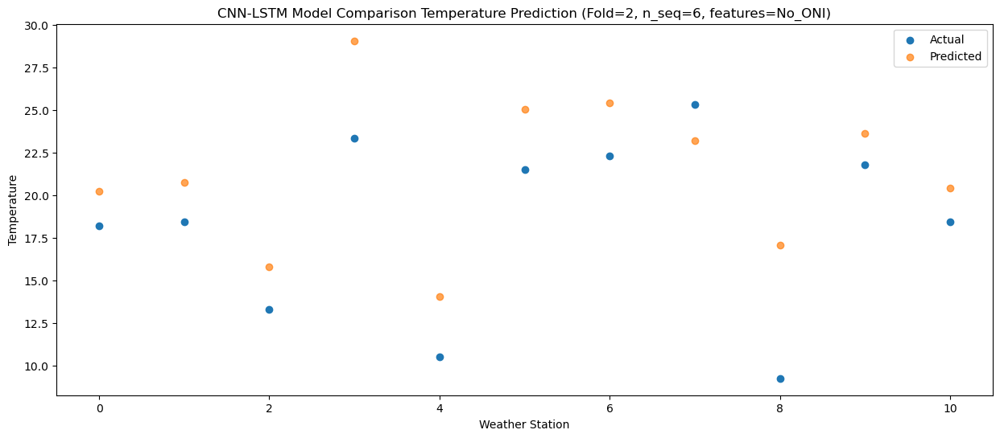

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  26.068393
1                 1   23.62  27.327475
2                 2   16.87  20.262901
3                 3   28.63  35.304642
4                 4   14.96  19.617193
5                 5   25.54  30.898886
6                 6   26.39  31.257607
7                 7   30.37  28.514253
8                 8   11.47  22.242258
9                 9   25.82  29.022041
10               10   23.34  25.899488


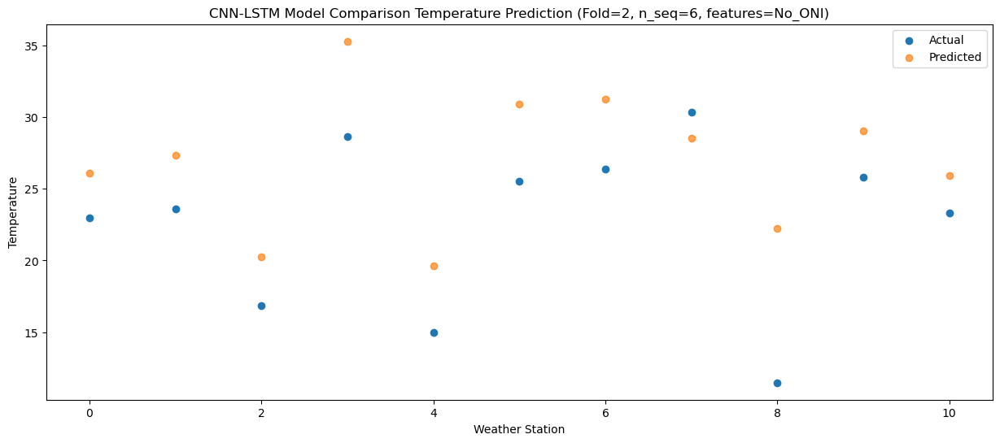

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  31.597553
1                 1   30.87  34.971951
2                 2   18.09  23.086758
3                 3   34.20  42.740381
4                 4   18.44  23.679057
5                 5   30.09  35.468984
6                 6   31.95  36.491417
7                 7   35.36  34.675600
8                 8   15.71  28.134659
9                 9   30.11  33.829165
10               10   28.75  31.132625


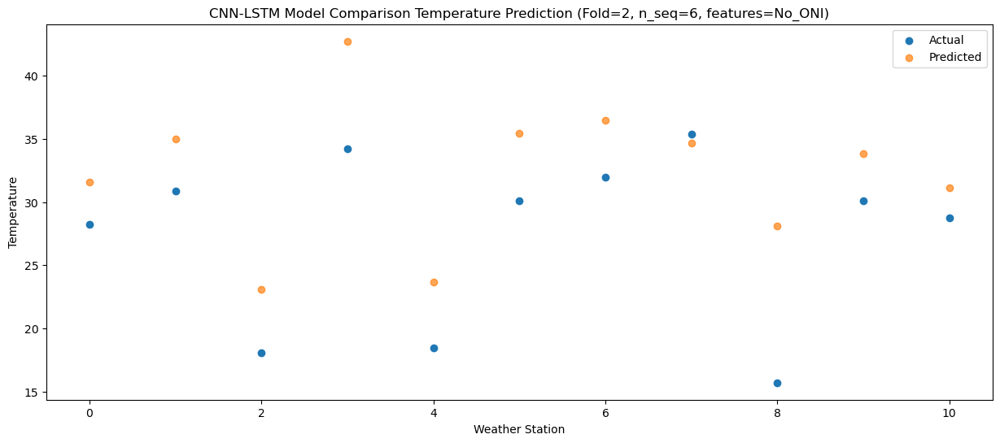

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]]
[[ 8.35591885  8.59859194  7.11136016 16.50968344  3.35611992 14.24527681
  14.04459034 12.9445606   7.88285138 12.25642517  8.47984357]
 [ 6.42592856  5.64275469 10.08042058 16.69329695  4.03897213 13.56417209
  12.06471454 14.36326356  9.5771177  13.16948875  8.9569862 ]
 [17.03775259 16.40779795 12.42550811 22.45843748 11.01399969 22.08668453
  22.47971164 17.77846999 10.82868566 19.96135029 16.42599608]
 [20.21946474 20.75611939 15.80001101 29.08090786 14.06863093 25.06351143
  25.44564449 23.19453378 17.09738197 23.65772995 20.40476347]
 [26.06839272 27.32747473 20.26

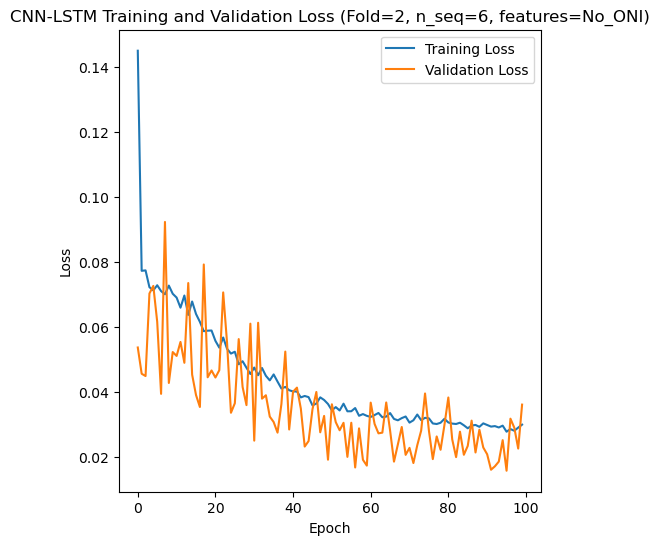

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 35s 220ms/step - loss: 0.1198 - accuracy: 0.7381 - mae: 0.1057 - rmse: 0.1198 - mape: 18.3796 - pearson: 0.7709 - val_loss: 0.0848 - val_accuracy: 0.7000 - val_mae: 0.0646 - val_rmse: 0.0848 - val_mape: 12.8913 - val_pearson: 0.7683
Epoch 2/100
84/84 [==============================] - 16s 190ms/step - loss: 0.0783 - accuracy: 0.7500 - mae: 0.0641 - rmse: 0.0783 - mape: 11.6187 - pearson: 0.8052 - val_loss: 0.0801 - val_accuracy: 0.7000 - val_mae: 0.0635 - val_rmse: 0.0801 - val_mape: 12.5917 - val_pearson: 0.7783
Epoch 3/100
84/84 [==============================] - 16s 185ms/step - loss: 0.0768 - accuracy: 0.7500 - mae: 0.0632 - rmse: 0.0768 - mape: 11.3571 - pearson: 0.8088

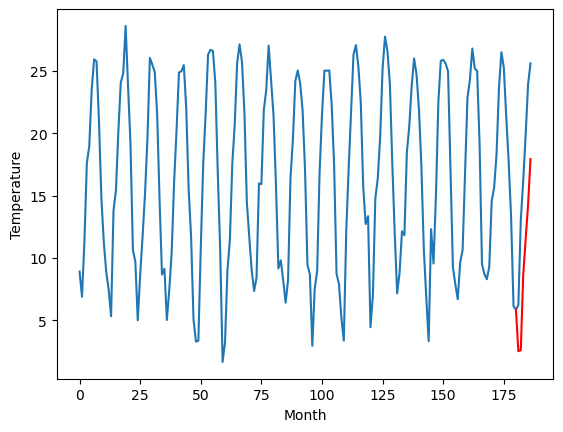

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		7.20		-0.55
4.03		3.16		-0.87
16.00		15.19		-0.81
17.86		18.15		0.29
22.08		21.90		-0.18
28.79		27.55		-1.24
[180, 181, 182, 183, 184, 185, 186]
[3.2, 7.200091147422791, 3.159845614433289, 15.194320940971375, 18.153811478614806, 21.902508521080016, 27.549345278739928]


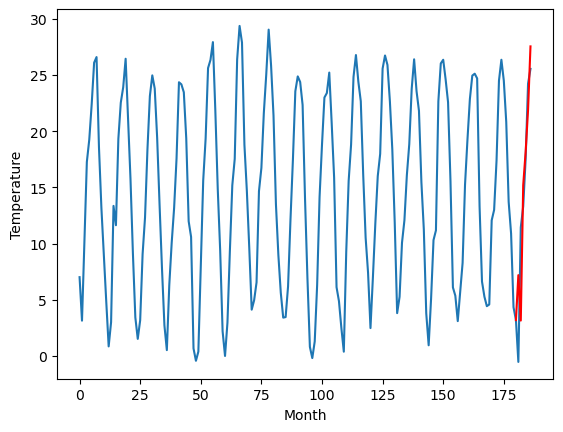

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		6.40		-1.88
10.58		5.21		-5.37
11.73		6.34		-5.39
17.46		10.48		-6.98
22.26		11.62		-10.64
27.11		15.82		-11.29
[180, 181, 182, 183, 184, 185, 186]
[8.48, 6.399239439964294, 5.20655776977539, 6.338853974342346, 10.48276867389679, 11.621552605628967, 15.824748177528381]


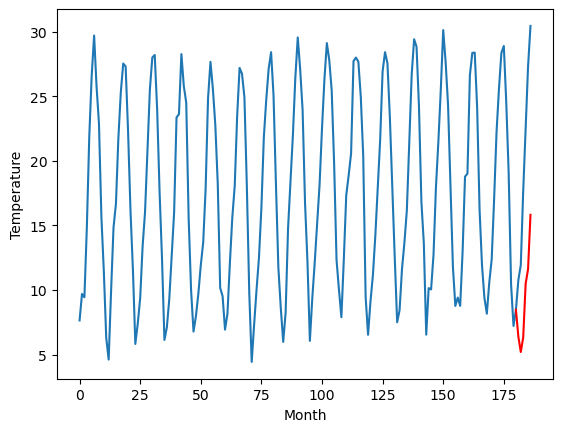

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		5.47		-0.72
4.87		3.80		-1.07
15.08		12.18		-2.90
17.43		15.89		-1.54
21.50		19.31		-2.19
27.42		24.58		-2.84
[180, 181, 182, 183, 184, 185, 186]
[1.55, 5.468069696426392, 3.800024294853211, 12.17857005596161, 15.893805289268494, 19.313047909736632, 24.577955746650694]


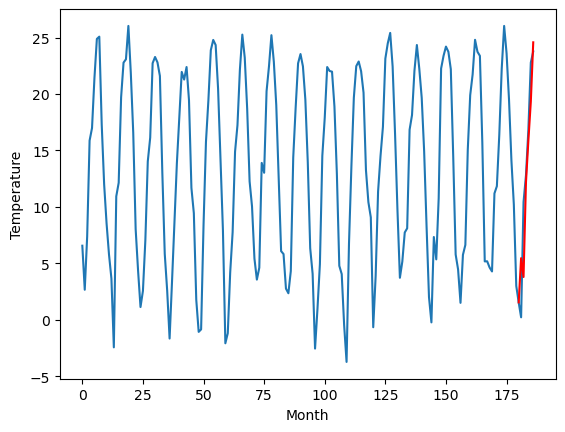

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		4.37		-0.73
1.23		0.20		-1.03
14.31		12.83		-1.48
17.60		16.57		-1.03
22.17		20.54		-1.63
29.65		26.91		-2.74
[180, 181, 182, 183, 184, 185, 186]
[1.08, 4.367819375991822, 0.19821984291076689, 12.826912469863892, 16.57225806236267, 20.54113800048828, 26.913965530395508]


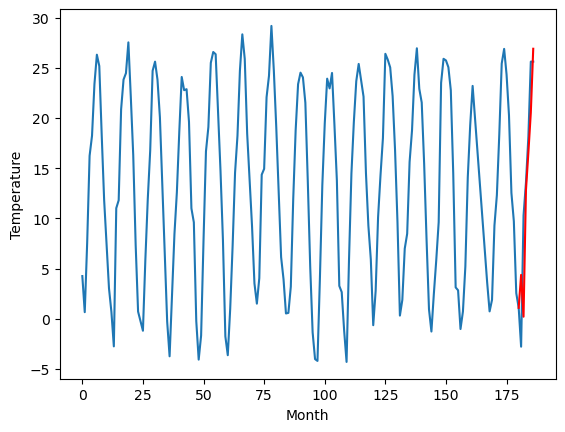

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		1.97		-0.83
0.08		-1.48		-1.56
11.41		9.99		-1.42
14.86		13.72		-1.14
19.14		17.55		-1.59
25.85		23.69		-2.16
[180, 181, 182, 183, 184, 185, 186]
[0.21, 1.9729342460632324, -1.4778547286987305, 9.994192123413086, 13.722878694534302, 17.554314851760864, 23.693742513656616]


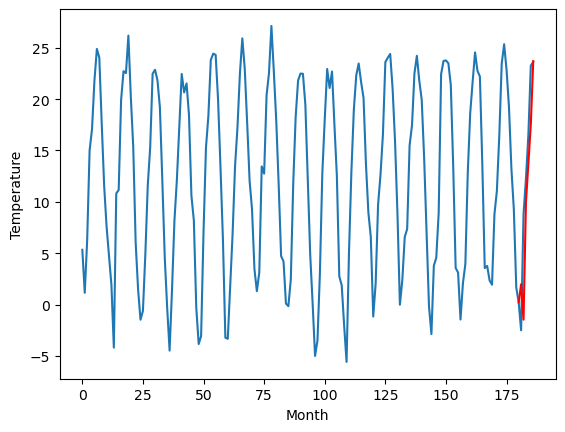

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		4.16		-1.44
5.70		3.22		-2.48
8.67		7.38		-1.29
13.45		11.55		-1.90
18.50		14.57		-3.93
25.89		20.10		-5.79
[180, 181, 182, 183, 184, 185, 186]
[-8.22, 4.162399606704712, 3.2181241083145142, 7.378263669013977, 11.551128106117249, 14.572613196372986, 20.098019556999205]


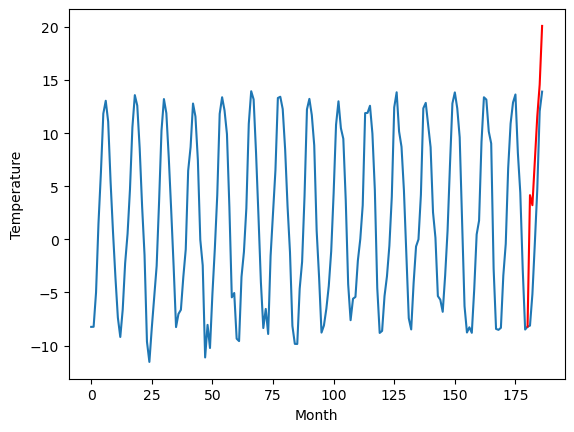

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-8.91		-1.22
-4.84		-10.16		-5.32
-3.24		-8.31		-5.07
4.73		-4.08		-8.81
9.16		-2.40		-11.56
16.80		2.43		-14.37
[180, 181, 182, 183, 184, 185, 186]
[10.04, -8.906623294353485, -10.159508516788483, -8.312823107242584, -4.079774191379547, -2.396540334224701, 2.432713816165924]


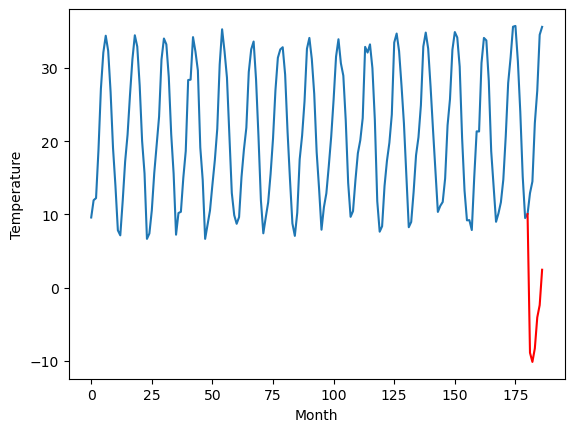

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.13		-1.66
11.72		8.38		-3.34
11.50		8.85		-2.65
13.69		12.69		-1.00
17.98		13.42		-4.56
19.68		16.72		-2.96
[180, 181, 182, 183, 184, 185, 186]
[9.17, 9.126128919124604, 8.382964618206024, 8.851176447868347, 12.688964552879334, 13.41617006778717, 16.71894187450409]


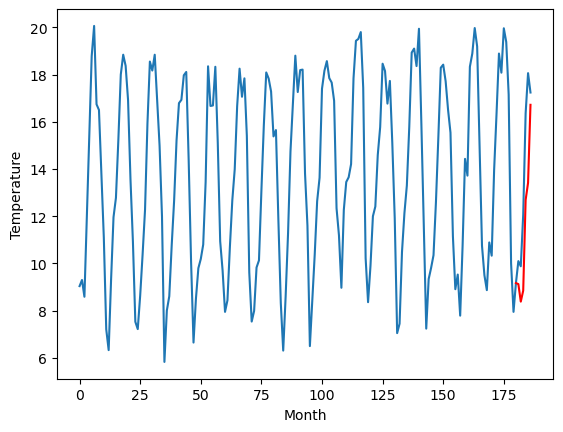

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		6.03		0.01
5.90		4.47		-1.43
10.90		10.11		-0.79
15.52		15.31		-0.21
20.35		19.05		-1.30
26.22		24.67		-1.55
[180, 181, 182, 183, 184, 185, 186]
[0.94, 6.025251665115356, 4.471035041809081, 10.112351932525634, 15.305339374542235, 19.054387369155883, 24.6738632106781]


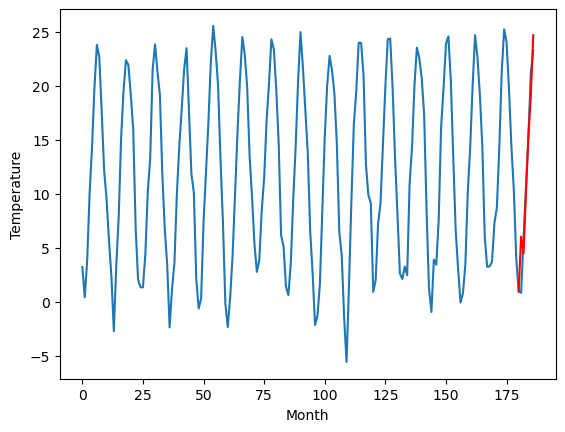

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		0.20		-1.44
0.84		-1.23		-2.07
8.03		5.11		-2.92
12.90		10.14		-2.76
17.16		13.91		-3.25
23.33		19.53		-3.80
[180, 181, 182, 183, 184, 185, 186]
[-0.13, 0.1982197284698488, -1.2273157119750975, 5.109436702728272, 10.138329219818115, 13.913005781173705, 19.528224420547485]


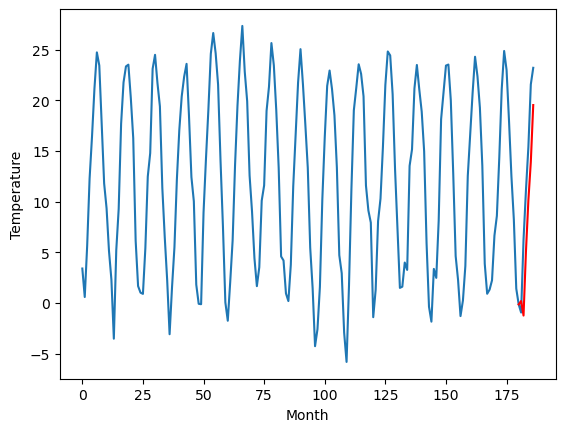

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   2.518898
1                 1    7.75   7.200091
2                 2    8.28   6.399239
3                 3    6.19   5.468070
4                 4    5.10   4.367819
5                 5    2.80   1.972934
6                 6    5.60   4.162400
7                 7   -7.69  -8.906623
8                 8   10.79   9.126129
9                 9    6.02   6.025252
10               10    1.64   0.198220


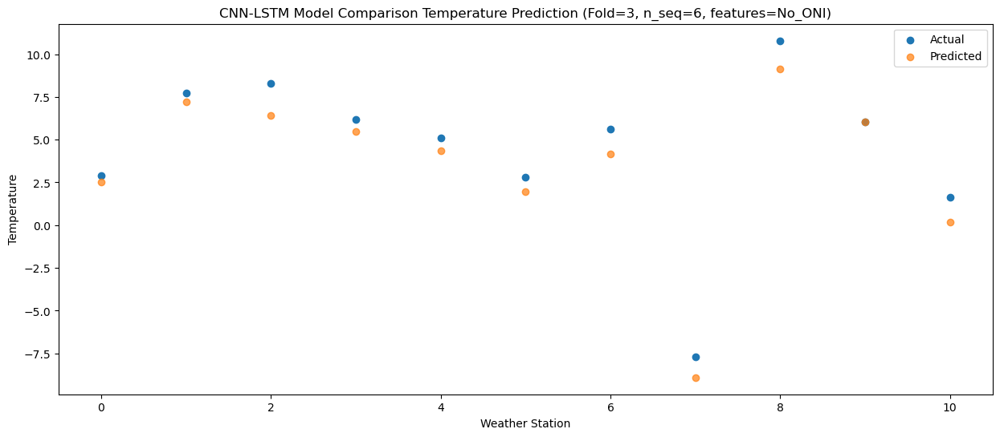

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29   2.604921
1                 1    4.03   3.159846
2                 2   10.58   5.206558
3                 3    4.87   3.800024
4                 4    1.23   0.198220
5                 5    0.08  -1.477855
6                 6    5.70   3.218124
7                 7   -4.84 -10.159509
8                 8   11.72   8.382965
9                 9    5.90   4.471035
10               10    0.84  -1.227316


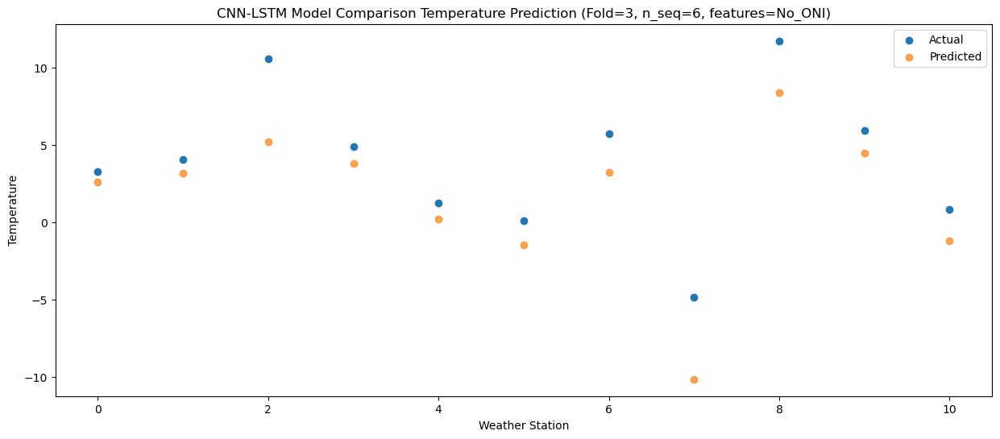

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   8.572629
1                 1   16.00  15.194321
2                 2   11.73   6.338854
3                 3   15.08  12.178570
4                 4   14.31  12.826912
5                 5   11.41   9.994192
6                 6    8.67   7.378264
7                 7   -3.24  -8.312823
8                 8   11.50   8.851176
9                 9   10.90  10.112352
10               10    8.03   5.109437


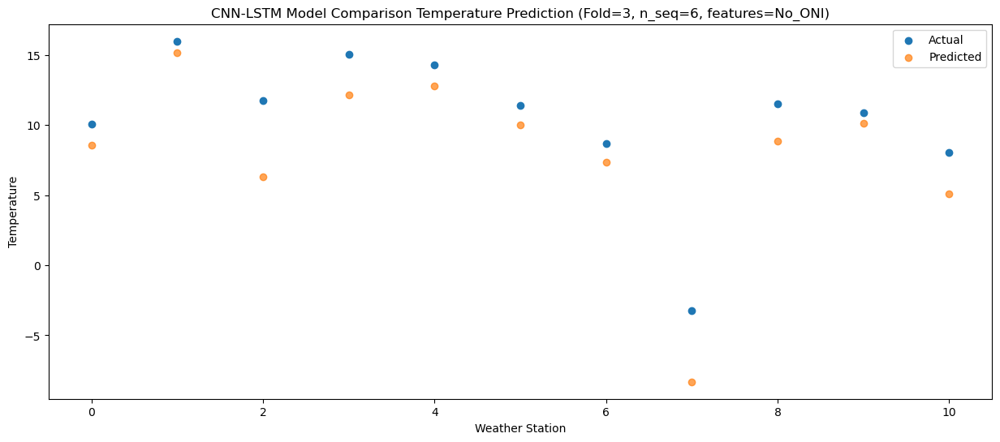

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  11.482216
1                 1   17.86  18.153811
2                 2   17.46  10.482769
3                 3   17.43  15.893805
4                 4   17.60  16.572258
5                 5   14.86  13.722879
6                 6   13.45  11.551128
7                 7    4.73  -4.079774
8                 8   13.69  12.688965
9                 9   15.52  15.305339
10               10   12.90  10.138329


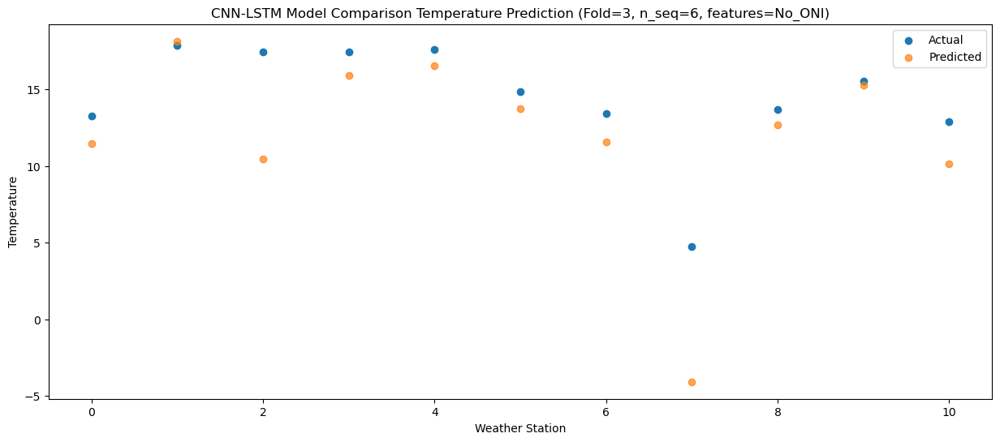

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  14.245475
1                 1   22.08  21.902509
2                 2   22.26  11.621553
3                 3   21.50  19.313048
4                 4   22.17  20.541138
5                 5   19.14  17.554315
6                 6   18.50  14.572613
7                 7    9.16  -2.396540
8                 8   17.98  13.416170
9                 9   20.35  19.054387
10               10   17.16  13.913006


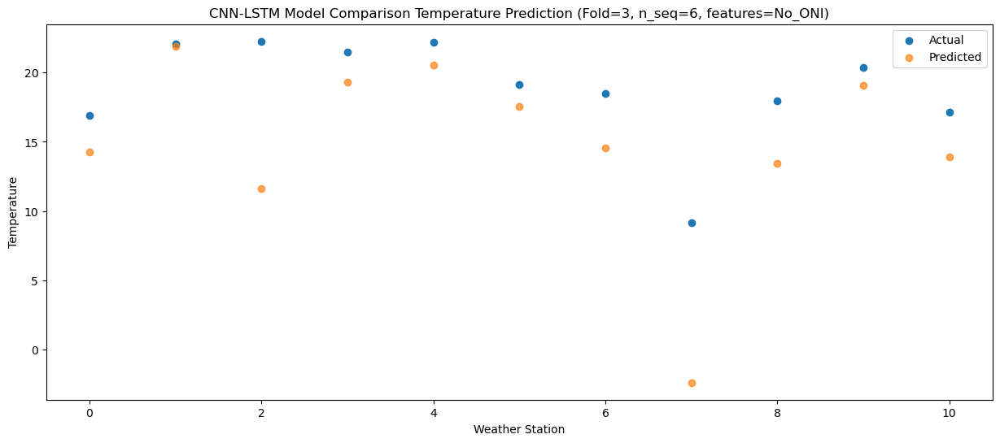

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  17.930905
1                 1   28.79  27.549345
2                 2   27.11  15.824748
3                 3   27.42  24.577956
4                 4   29.65  26.913966
5                 5   25.85  23.693743
6                 6   25.89  20.098020
7                 7   16.80   2.432714
8                 8   19.68  16.718942
9                 9   26.22  24.673863
10               10   23.33  19.528224


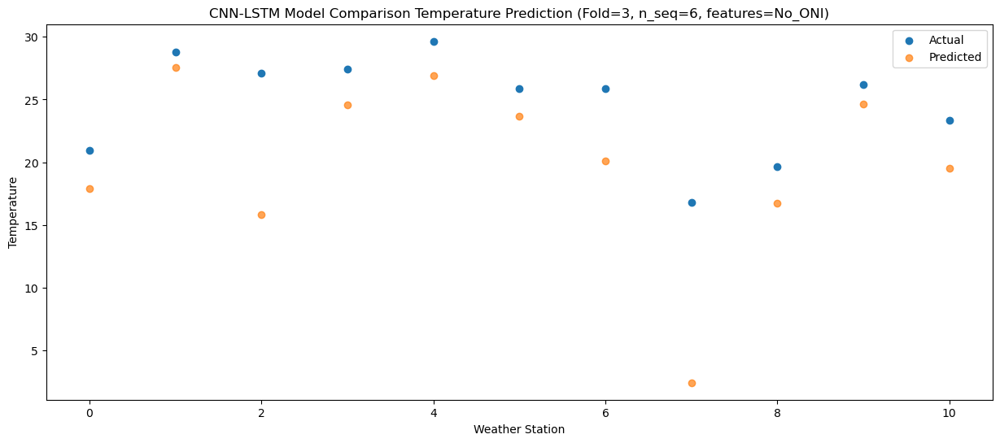

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]]
[[  2.51889808   7.20009115   6.39923944   5.4680697    4.36781938
    1.97293425   4.16239961  -8.90662329   9.12612892   6.02525167
    0.19821973]
 [  2.60492088   3.15984561   5.20655777   3.80002429   0.19821984
   -1.47785473   3.21812411 -10.15950852   8.38296462   4.47103504
   -1.22731571]
 [  8.57262946  15.19432094   6.33885397  12.17857006  12.82691247
    9.99419212   7.37826367  -8.31282311   8.85117645  10.11235193
    5.1094367 ]
 [ 11.48221613  18.15381148  10.48276867  15.89380529  16.57225806
   13.72287869  11.55112811  -4.07977419  12.68896455  15.3053

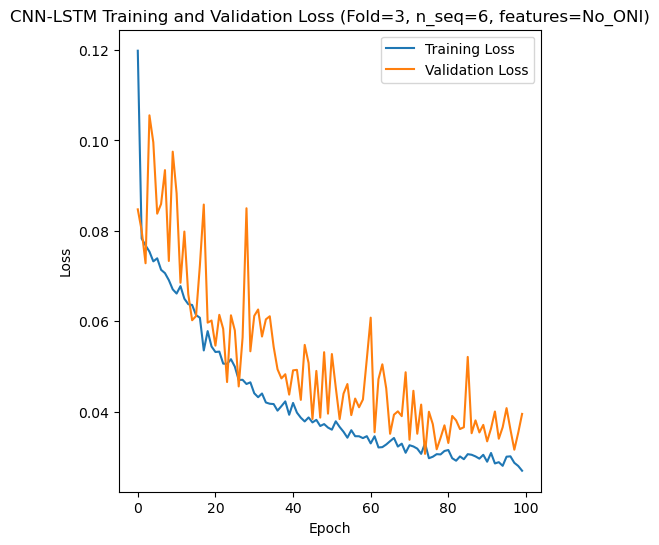

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 32s 192ms/step - loss: 0.1287 - accuracy: 0.6429 - mae: 0.1129 - rmse: 0.1287 - mape: 19.0752 - pearson: 0.6899 - val_loss: 0.1268 - val_accuracy: 0.7000 - val_mae: 0.1092 - val_rmse: 0.1268 - val_mape: 17.4896 - val_pearson: 0.7257
Epoch 2/100
84/84 [==============================] - 10s 123ms/step - loss: 0.0777 - accuracy: 0.7143 - mae: 0.0635 - rmse: 0.0777 - mape: 11.0657 - pearson: 0.7680 - val_loss: 0.0794 - val_accuracy: 0.7000 - val_mae: 0.0632 - val_rmse: 0.0794 - val_mape: 11.8526 - val_pearson: 0.8183
Epoch 3/100
84/84 [==============================] - 13s 156ms/step - loss: 0.0724 - accuracy: 0.7381 - mae: 0.0586 - rmse: 0.0724 - mape: 10.2165 - pearson: 0.7807

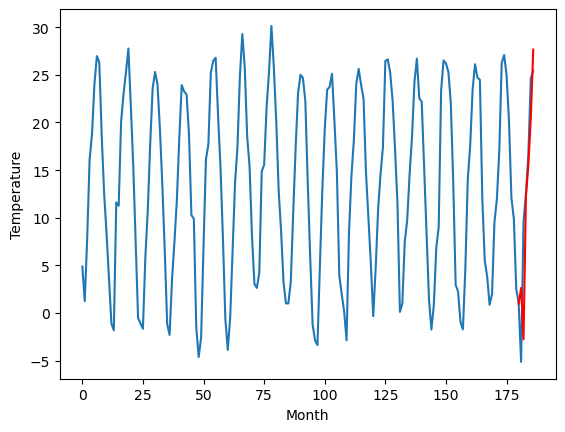

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		5.66		0.07
9.02		7.63		-1.39
10.62		10.49		-0.13
12.06		13.00		0.94
16.10		15.98		-0.12
17.73		17.70		-0.03
[180, 181, 182, 183, 184, 185, 186]
[14.25, 5.6625456357002255, 7.632850244045257, 10.492893769741059, 12.999237611293793, 15.975605323314667, 17.703701689243317]


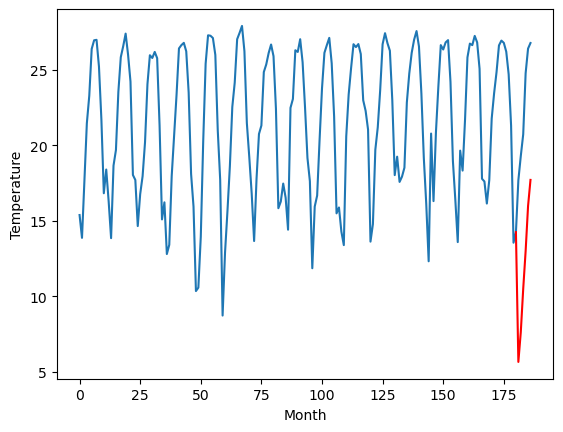

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		15.33		-0.08
13.49		13.64		0.15
22.82		23.07		0.25
23.89		25.43		1.54
28.36		29.59		1.23
32.62		33.37		0.75
[180, 181, 182, 183, 184, 185, 186]
[9.06, 15.325676993578673, 13.6421479742229, 23.067856744974854, 25.425557331293824, 29.588671879023316, 33.37497063085437]


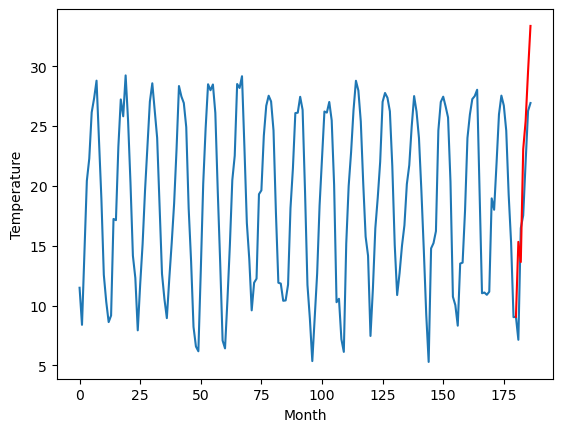

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		11.10		0.53
7.11		7.68		0.57
18.07		20.11		2.04
19.76		22.54		2.78
23.92		27.03		3.11
29.60		32.57		2.97
[180, 181, 182, 183, 184, 185, 186]
[7.48, 11.104795714616776, 7.675592204332352, 20.105329295396807, 22.54392673611641, 27.0264263355732, 32.567402859926226]


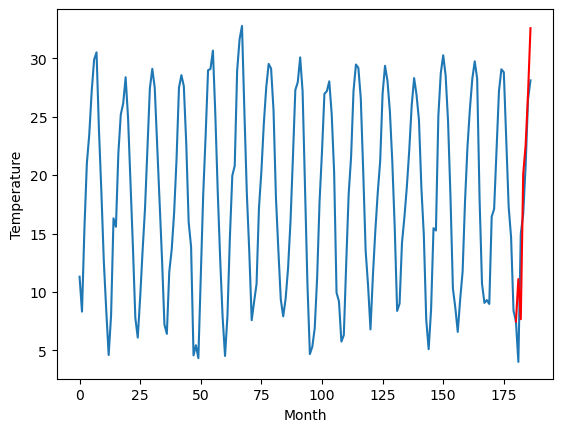

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.91		0.20
6.82		7.46		0.64
17.74		19.90		2.16
19.92		22.41		2.49
23.45		26.89		3.44
30.30		32.55		2.25
[180, 181, 182, 183, 184, 185, 186]
[7.33, 10.91216611623764, 7.455434081554413, 19.896840331554415, 22.410144088268282, 26.89468645811081, 32.55160259962082]


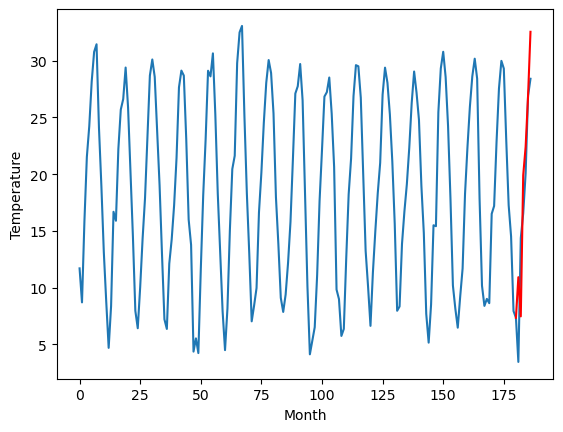

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		11.63		1.04
9.02		10.30		1.28
18.27		19.10		0.83
20.50		22.25		1.75
25.99		26.51		0.52
30.95		31.70		0.75
[180, 181, 182, 183, 184, 185, 186]
[6.59, 11.627971495091915, 10.299933517873287, 19.101272667348383, 22.24779518932104, 26.508028114736078, 31.696596229970453]


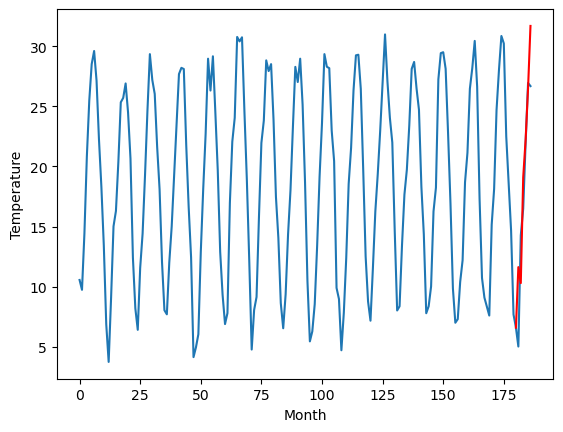

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		10.42		-0.37
11.46		10.69		-0.77
17.86		18.14		0.28
20.59		21.11		0.52
24.04		25.14		1.10
28.06		29.51		1.45
[180, 181, 182, 183, 184, 185, 186]
[6.04, 10.42403638124466, 10.685823348760605, 18.13564672827721, 21.10936155676842, 25.138166812658312, 29.50908890128136]


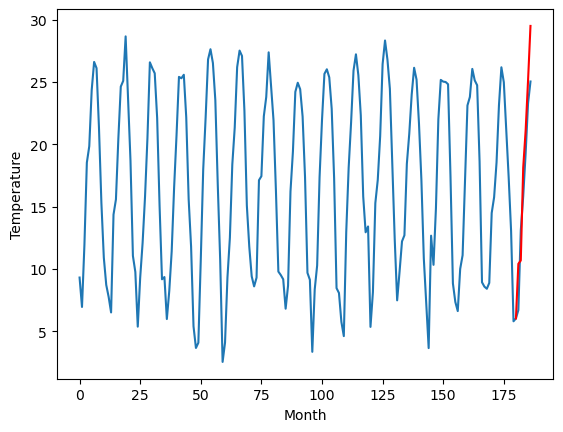

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.79		1.14
4.04		5.32		1.28
16.31		18.19		1.88
18.21		20.97		2.76
22.25		25.38		3.13
28.55		31.42		2.87
[180, 181, 182, 183, 184, 185, 186]
[3.13, 8.792244918346405, 5.320181376934052, 18.19178248167038, 20.973862416744232, 25.38285470724106, 31.42143369436264]


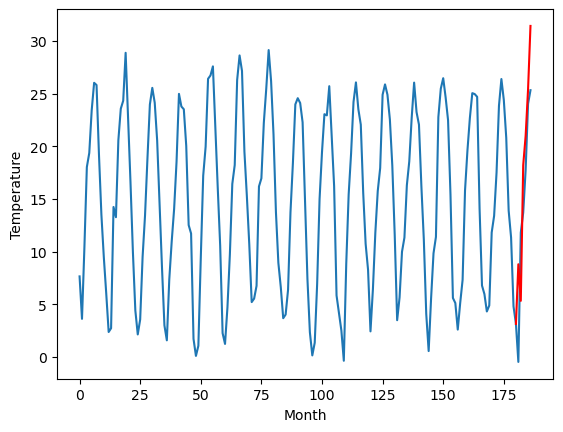

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.22		0.16
2.70		2.74		0.04
14.67		15.22		0.55
18.32		18.87		0.55
22.73		23.63		0.90
29.97		30.32		0.35
[180, 181, 182, 183, 184, 185, 186]
[-0.29, 6.220821394920349, 2.744008316993713, 15.223751320838929, 18.866989150047303, 23.631696238517762, 30.321812644004822]


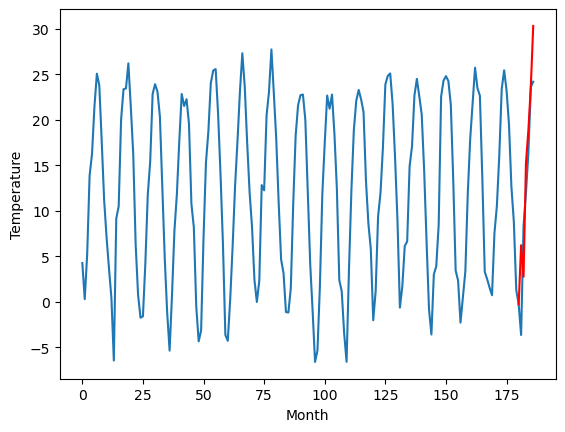

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.81		0.58
-2.21		-2.13		0.08
11.65		12.35		0.70
15.36		15.94		0.58
20.14		20.93		0.79
27.53		28.15		0.62
[180, 181, 182, 183, 184, 185, 186]
[-1.03, 2.809546122550964, -2.129785408973694, 12.347764143943786, 15.944778809547424, 20.930331597328184, 28.15386999607086]


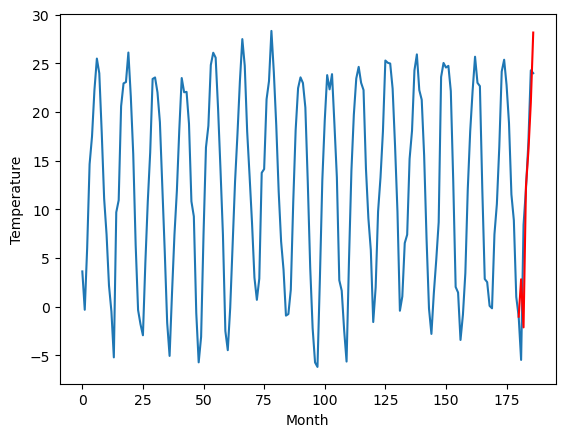

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		2.00		0.30
-0.54		-0.63		-0.09
9.35		9.90		0.55
13.15		14.08		0.93
17.68		19.05		1.37
24.57		25.71		1.14
[180, 181, 182, 183, 184, 185, 186]
[-2.29, 1.9983936500549317, -0.6337577152252196, 9.902787084579469, 14.07685648918152, 19.045385236740113, 25.71146285057068]


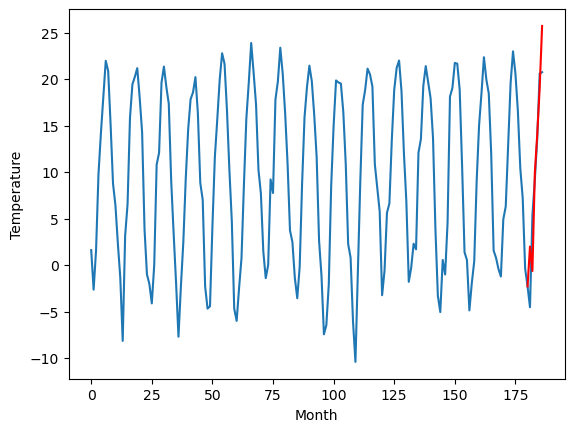

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.642940
1                 1    5.59   5.662546
2                 2   15.41  15.325677
3                 3   10.57  11.104796
4                 4   10.71  10.912166
5                 5   10.59  11.627971
6                 6   10.79  10.424036
7                 7    7.65   8.792245
8                 8    6.06   6.220821
9                 9    2.23   2.809546
10               10    1.70   1.998394


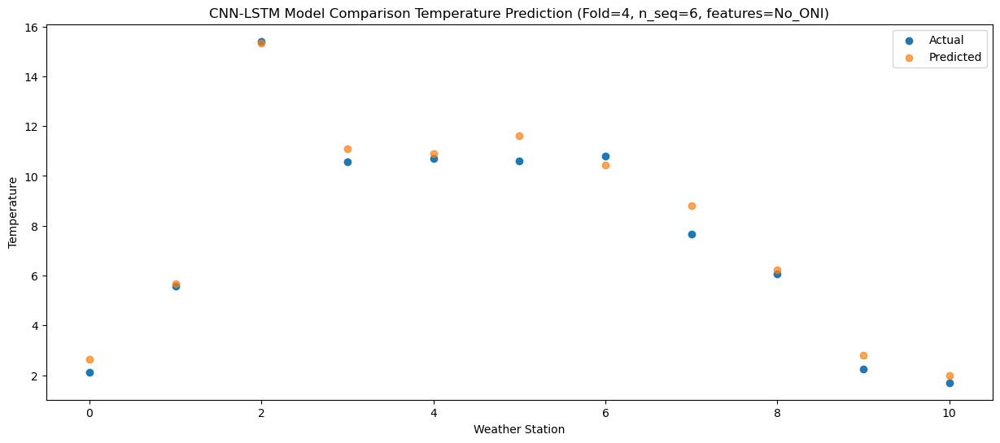

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -2.754589
1                 1    9.02   7.632850
2                 2   13.49  13.642148
3                 3    7.11   7.675592
4                 4    6.82   7.455434
5                 5    9.02  10.299934
6                 6   11.46  10.685823
7                 7    4.04   5.320181
8                 8    2.70   2.744008
9                 9   -2.21  -2.129785
10               10   -0.54  -0.633758


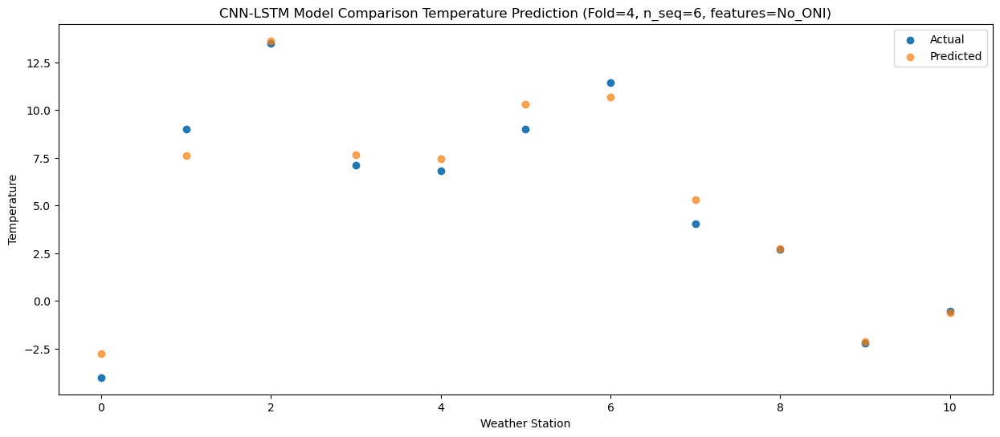

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71  12.302971
1                 1   10.62  10.492894
2                 2   22.82  23.067857
3                 3   18.07  20.105329
4                 4   17.74  19.896840
5                 5   18.27  19.101273
6                 6   17.86  18.135647
7                 7   16.31  18.191782
8                 8   14.67  15.223751
9                 9   11.65  12.347764
10               10    9.35   9.902787


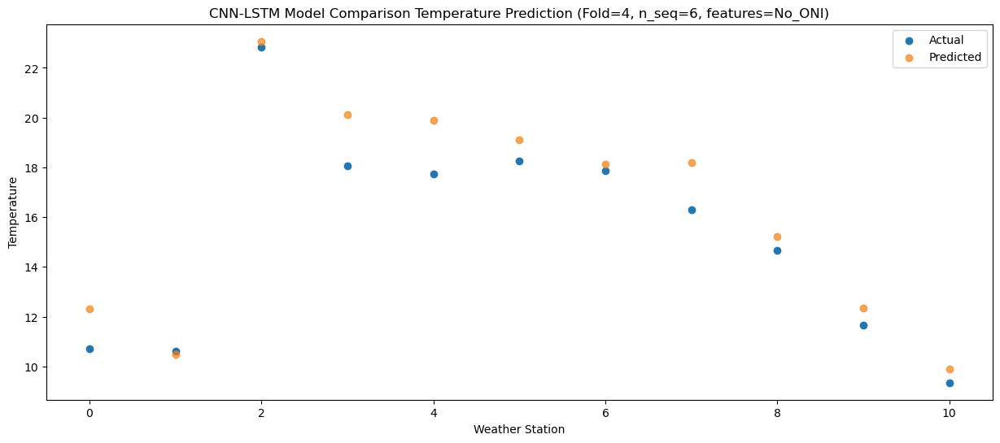

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  15.561424
1                 1   12.06  12.999238
2                 2   23.89  25.425557
3                 3   19.76  22.543927
4                 4   19.92  22.410144
5                 5   20.50  22.247795
6                 6   20.59  21.109362
7                 7   18.21  20.973862
8                 8   18.32  18.866989
9                 9   15.36  15.944779
10               10   13.15  14.076856


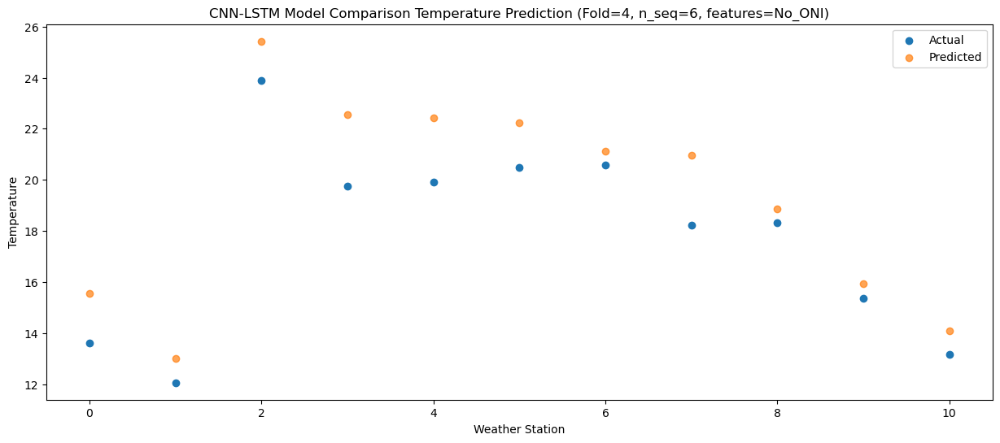

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  20.458529
1                 1   16.10  15.975605
2                 2   28.36  29.588672
3                 3   23.92  27.026426
4                 4   23.45  26.894686
5                 5   25.99  26.508028
6                 6   24.04  25.138167
7                 7   22.25  25.382855
8                 8   22.73  23.631696
9                 9   20.14  20.930332
10               10   17.68  19.045385


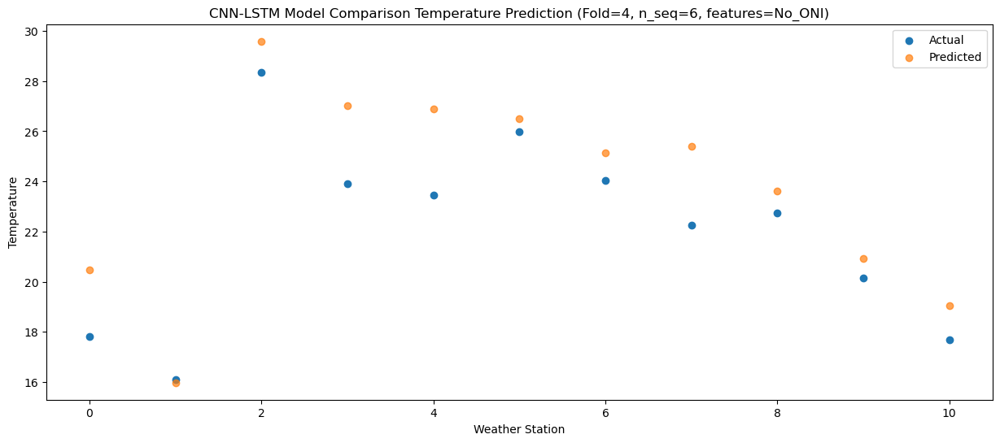

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  27.642803
1                 1   17.73  17.703702
2                 2   32.62  33.374971
3                 3   29.60  32.567403
4                 4   30.30  32.551603
5                 5   30.95  31.696596
6                 6   28.06  29.509089
7                 7   28.55  31.421434
8                 8   29.97  30.321813
9                 9   27.53  28.153870
10               10   24.57  25.711463


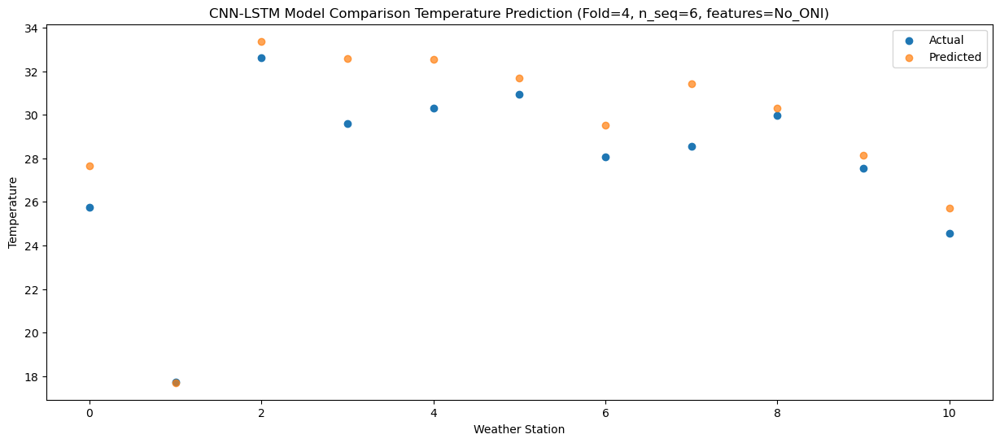

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]]
[[ 2.64293992  5.66254564 15.32567699 11.10479571 10.91216612 11.6279715
  10.42403638  8.79224492  6.22082139  2.80954612  1.99839365]
 [-2.7545892   7.63285024 13.64214797  7.6755922   7.45543408 10.29993352
  10.68582335  5.32018138  2.74400832 -2.12978541 -0.63375772]
 [12.30297076 10.49289377 23.06785674 20.1053293  19.89684033 19.10127267
  18.13564673 18.19178248 15.22375132 12.34776414  9.90278708]
 [15.56142413 12.99923761 25.42555733 22.54392674 22.41014409 22.24779519
  21.10936156 20.97386242 18.86698915 15.94477881 14.07685649]
 [20.45852935 15.97560532 29.588

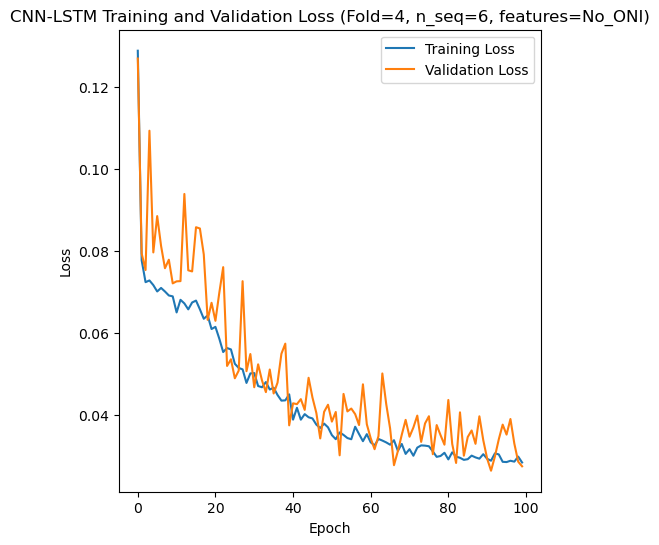

[[2.215371157049105], [0.8711540500890962], [3.7649946979239997], [4.029609887945049], [1.4424449661418086]]
[[array(2.21537116)], [array(0.87115405)], [array(3.7649947)], [array(4.02960989)], [array(1.44244497)]]
[[1.7873367398943412], [0.7340427910649417], [2.8551640256923245], [2.8030753994349276], [1.117110190734719]]
[[0.12227331935727169], [0.0601307521422423], [0.20156302292004807], [0.6088228644864108], [0.08404590525630515]]
[[0.9194840712353997], [0.9864714549313977], [0.7921603400548669], [0.7787184521530742], [0.9735079596825639]]
[[array(0.08409966)], [array(0.06013075)], [array(0.20156302)], [array(0.52327842)], [array(0.06814589)]]
[[array(0.98470535)], [array(0.99405801)], [array(0.91633015)], [array(0.88816575)], [array(0.99049299)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 12.87 12.78 17.84 19.24 23.26 26.74
 15.34 16.2  22.18 23.82 27.8  31.94  9.    7.43 15.34 17.13 21.1  24.38
 13.35 10.26 20.16 22.09 25.95 31.15 11.52 12.17 17.07 20.44 23.95 28.52
 10.21 10.85 17.83 1

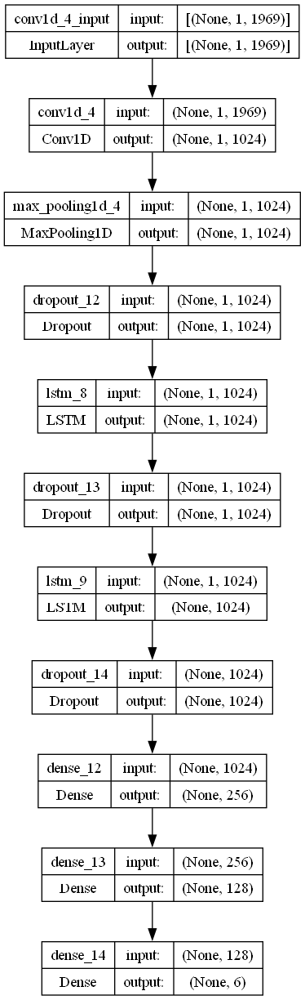

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 1024
    lr = 0.09727614755306281
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.11844994511316412

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S6_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)